# Differentiable Forwards Modelled Interferrometry

This little tutorial is designed to give an overview of how to forwards-model fit interferrometric observables directly to data, including aberratios and detector effects.

In [1]:
import os
os.environ["XLA_FLAGS"] = '--xla_force_host_platform_device_count=2'

import jax
import jax.numpy as np
import dLux as dl
import dLux.utils as dlu

jax.config.update("jax_enable_x64", True)

from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 120

In [2]:
from lib import get_files, summarise_files

# Bind file path, type and exposure type
file_fn = lambda **kwargs: get_files(
    "/Users/louis/Data/JWST/COM1093/stage2/",
    "cal",
    EXP_TYPE="NIS_AMI",
    PATTTYPE="NONE",
    **kwargs,
)

stars = ["AB-DOR", "HD-37093", "HD-36805"]

files = []
for star in stars:
    fs = file_fn(TARGPROP=star)
    print(f"\n{len(fs)}")
    summarise_files(fs, ["ACT_ID"])
    files += fs

print(f"\n{len(files)}")
summarise_files(files, ["ACT_ID", "NGROUPS", "NINTS", "DURATION"])


8
  TARGPROP: AB-DOR
  TARGNAME: HD 36705
  FILTER: F380M, F480M, F430M
  OBSERVTN: 012, 013
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 02, 05, 03

6
  TARGPROP: HD-37093
  TARGNAME: HD 37093
  FILTER: F380M, F480M, F430M
  OBSERVTN: 015, 016
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 02, 03

6
  TARGPROP: HD-36805
  TARGNAME: HD 36805
  FILTER: F380M, F480M, F430M
  OBSERVTN: 019, 018
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM
  SUBARRAY: SUB80
  DETECTOR: NIS
  DATAMODL: ImageModel
  INSTRUME: NIRISS
  EXP_TYPE: NIS_AMI
  ACT_ID: 04, 02, 03

20
  TARGPROP: HD-37093, AB-DOR, HD-36805
  TARGNAME: HD 37093, HD 36805, HD 36705
  FILTER: F380M, F480M, F430M
  OBSERVTN: 012, 018, 015, 016, 019, 013
  PATTTYPE: NONE
  APERNAME: NIS_AMI1
  PUPIL: NRM


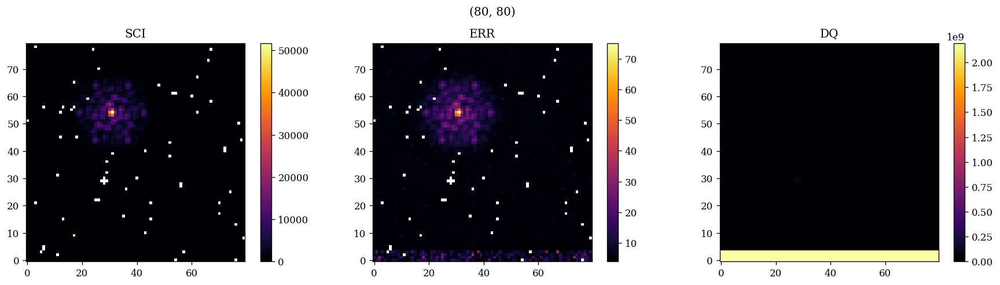

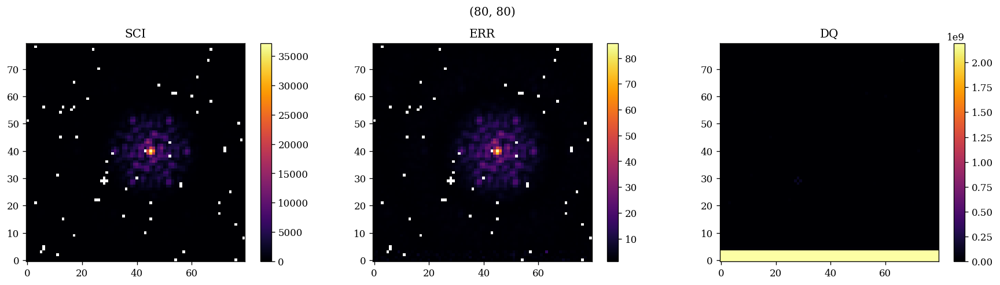

In [3]:
from lib import plot_image

for file in files[:2]:
    plot_image(file, 0)

In [4]:
from jax import lax


def FIM(pytree, parameters, loglike_fn, *loglike_args, shape_dict={}, **loglike_kwargs):
    # Build X vec
    pytree = zdx.tree.set_array(pytree, parameters)
    shapes, lengths = zdx.bayes._shapes_and_lengths(pytree, parameters, shape_dict)
    X = np.zeros(zdx.bayes._lengths_to_N(lengths))

    # Build function to calculate FIM and calculate
    @jax.hessian
    def calc_fim(X):
        parametric_pytree = _perturb(X, pytree, parameters, shapes, lengths)
        return loglike_fn(parametric_pytree, *loglike_args, **loglike_kwargs)

    return calc_fim(X)


def _perturb(X, pytree, parameters, shapes, lengths):
    n, xs = 0, []
    if isinstance(parameters, str):
        parameters = [parameters]
    indexes = range(len(parameters))

    for i, param, shape, length in zip(indexes, parameters, shapes, lengths):
        if length == 1:
            xs.append(X[i + n])
        else:
            xs.append(lax.dynamic_slice(X, (i + n,), (length,)).reshape(shape))
            n += length - 1

    return pytree.add(parameters, xs)

In [5]:
import optax


def fit_image(
    tel,
    file,
    loss_fn,
    support,
    epochs,
    params,
    optimisers,
    starts,
    loss_scale=1e-4,
    verbose=True,
):
    im = np.array(file[1].data).astype(float)
    err = np.array(file[2].data).astype(float)

    model = initialise_for_data(tel, file)
    optim, opt_state = zdx.get_optimiser(model, params, optimisers)

    loss, _ = loss_fn(model, im, err, support)
    losses, models_out = [], [model]

    if verbose:
        looper = tqdm(range(epochs), desc="Loss %.2f" % (loss * loss_scale))
    else:
        looper = range(epochs)

    for i in looper:
        # calculate the loss and gradient
        new_loss, grads = loss_fn(model, im, err, support)
        if new_loss > loss:
            print(
                f"Loss increased from {loss * loss_scale} to {new_loss * loss_scale} "
                f"on {i} th epoch"
            )
        loss = new_loss
        if np.isnan(loss):
            raise ValueError(f"Loss is NaN on {i} th epoch")

        for param, start in zip(params, starts):
            if i < start:
                grads = grads.multiply(param, 0.0)

        # apply the update
        updates, opt_state = optim.update(grads, opt_state)
        model = zdx.apply_updates(model, updates)

        # TODO: Make this into a "norm fn" that allows users to specify
        # Re-normalise the source (weights and phases)
        source = model.source
        norm_weights = source.weights / source.weights.sum()
        norm_phases = source.phases - source.phases[0]
        norm_ampls = source.amplitudes / source.amplitudes[0]
        norm_source = source.set(
            ["weights", "phases", "amplitudes"], [norm_weights, norm_phases, norm_ampls]
        )
        # norm_source = model.source.normalise()
        model = model.set("source", norm_source)

        # save results
        models_out.append(model)
        losses.append(loss)

        if verbose:
            looper.set_description("Loss %.2f" % (loss * loss_scale))

    return losses, models_out

In [6]:
h = 6.626e-34
c = 3.0e8
k = 1.38e-23

def planck(wav, T):
    a = 2.0 * h * c**2
    b = h * c / (wav * k * T)
    intensity = a / ((wav**5) * (np.exp(b) - 1.0))
    return intensity

Teffs = {
    'AB-DOR': 5280,
    'HD-37093': 4410,
    'HD-36805': 5040
}

In [7]:
import os

from lib import (
    get_webb_osys_fits,
    initialise_for_data,
    UVSource,
    get_AMI_splodge_mask,
    Null,
    loglike_fn,
    like_fn,
)

from lib import (
    compare,
    show_splodges,
    show_likelihoods,
    pairwise_vectors,
    plot_vis,
    get_nan_support,
)
from zodiax.experimental import serialise, deserialise
from nrm_analysis.misctools import mask_definitions


import zodiax as zdx
import dLuxWebbpsf as dlw
import numpy as onp

for file in tqdm(files):

    # Check for already fit
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"Fitting: {name}")

    tdays = file[0].header["EXPEND"] - file[0].header["EXPSTART"]
    print(f"Total Exposure Time: {tdays * 24 * 60 * 60:.2f} sec")

    if name + '.zdx' in os.listdir('files/models/'):
        print(f"Already fit {name}, skipping\n")
        continue

    inst, psf_fits = get_webb_osys_fits(file)

    # Get modelling wavelengths
    wls= []
    for i in range(9):
        wls.append(psf_fits[0].header[f"WAVE{i}"])
    wls = np.array(wls)

    # Create unitary weights so we can get the filter weights
    poppy_source = {'wavelengths': onp.array(wls), 'weights': onp.ones_like(wls)}
    psf_fits = inst.calc_psf(source=poppy_source)

    # Now we get filter weights
    filt = []
    for i in range(9):
        filt.append(psf_fits[0].header[f"WGHT{i}"])
    filt = np.array(filt)

    # Get spectra
    wgts = planck(wls, Teffs[head["TARGPROP"]])

    # Get the dLux object
    tel = dlw.NIRISS(
        filter=inst.filter,
        aperture=inst.aperturename,
        detector=inst.detector,
        pupil_mask=inst.pupil_mask,
        radial_orders=[0,1,2],
        AMI=True,
    )
    tel = tel.multiply("basis", 1e-9) # Normalise to nm

    # Update with the latest WFS data
    planes = inst.optsys.planes
    tel = tel.set("pupil.opd", np.array(planes[0].opd))
    tel = tel.set("aberrations.opd", np.array(planes[2].opd))

    # Remove Charge Diffusion and intialise for data
    tel = tel.set("ChargeDiffusion", Null())
    tel = initialise_for_data(tel, file)

    # Generate Mask and Source
    mask_path = f"files/masks/{head['FILTER']}.npy"
    if os.path.exists(mask_path):
        print("Using cached mask")
        masks = np.load(mask_path)
    else:
        print("Generating mask")
        masks = get_AMI_splodge_mask(tel, wls, verbose=False)
        np.save(mask_path, masks)
    source = UVSource(wls, masks, flux=tel.flux, position=tel.position, weights=wgts)
    model = tel.set("source", source)

    # Get support
    support, support_mask = get_nan_support(file, n_mask=3, order=2)

    # Define loss function
    params = [
        "position",
        "coefficients",
        "flux",
        "amplitudes",
        "phases"
    ]

    @zdx.filter_jit
    @zdx.filter_value_and_grad(params)
    def loss_fn(model, data, err, support):
        return -loglike_fn(model, data, err, support).sum()

    # Evaluate
    print("Compiling")
    im = np.array(file[1].data).astype(float)
    err = np.array(file[2].data).astype(float)
    loss, grads = loss_fn(model, im, err, support)

    # Check for nans in loss and grads
    for v in grads.get(params) + [loss]:
        if np.isnan(v).any():
            print("NaNs in loss or grads. skipping")
            continue

    # Optimise
    optimisers = [
        optax.sgd(2e-10), # pos
        optax.sgd(1e-2),  # coeff
        optax.sgd(2e6),   # flux
        optax.sgd(2e-8),  # ampl
        optax.sgd(1e-7),  # phase
    ]
    starts = [
        0,   # pos
        5,   # coeff
        20,  # flux
        10,  # ampl
        10,  # phase
    ]

    print(f"Fitting...")
    try:
        losses, models_out = fit_image(
            model, file, loss_fn, support, 100, params, optimisers, starts
        )
    except ValueError as e:
        print("Skipping")
        continue

    # Get the params from each model
    params_out = {}
    for param in params:
        params_out[param] = [model.get(param) for model in models_out]

    serialise(f"files/models/{name}.zdx", models_out[-1])
    serialise(f"files/params/{name}.zdx", params_out)
    np.save(f"files/losses/{name}.npy", losses)

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-062 CANNOT BE CHECKED AGAINST ONLINE VERSION


  0%|          | 0/20 [00:00<?, ?it/s]

Fitting: AB-DOR_F430M_013_03
Total Exposure Time: 30.93 sec
Already fit AB-DOR_F430M_013_03, skipping

Fitting: AB-DOR_F480M_012_05
Total Exposure Time: 30.63 sec
Already fit AB-DOR_F480M_012_05, skipping

Fitting: AB-DOR_F430M_012_03
Total Exposure Time: 30.93 sec
Already fit AB-DOR_F430M_012_03, skipping

Fitting: AB-DOR_F480M_013_05
Total Exposure Time: 30.63 sec
Already fit AB-DOR_F480M_013_05, skipping

Fitting: AB-DOR_F380M_013_04
Total Exposure Time: 36.21 sec
Already fit AB-DOR_F380M_013_04, skipping

Fitting: AB-DOR_F480M_012_02
Total Exposure Time: 31.23 sec
Already fit AB-DOR_F480M_012_02, skipping

Fitting: AB-DOR_F380M_012_04
Total Exposure Time: 36.21 sec
Already fit AB-DOR_F380M_012_04, skipping

Fitting: AB-DOR_F480M_013_02
Total Exposure Time: 31.23 sec
Already fit AB-DOR_F480M_013_02, skipping

Fitting: HD-37093_F430M_016_03
Total Exposure Time: 58.84 sec
Already fit HD-37093_F430M_016_03, skipping

Fitting: HD-37093_F480M_015_02
Total Exposure Time: 59.82 sec
Already

Plotting: AB-DOR_F430M_013_03


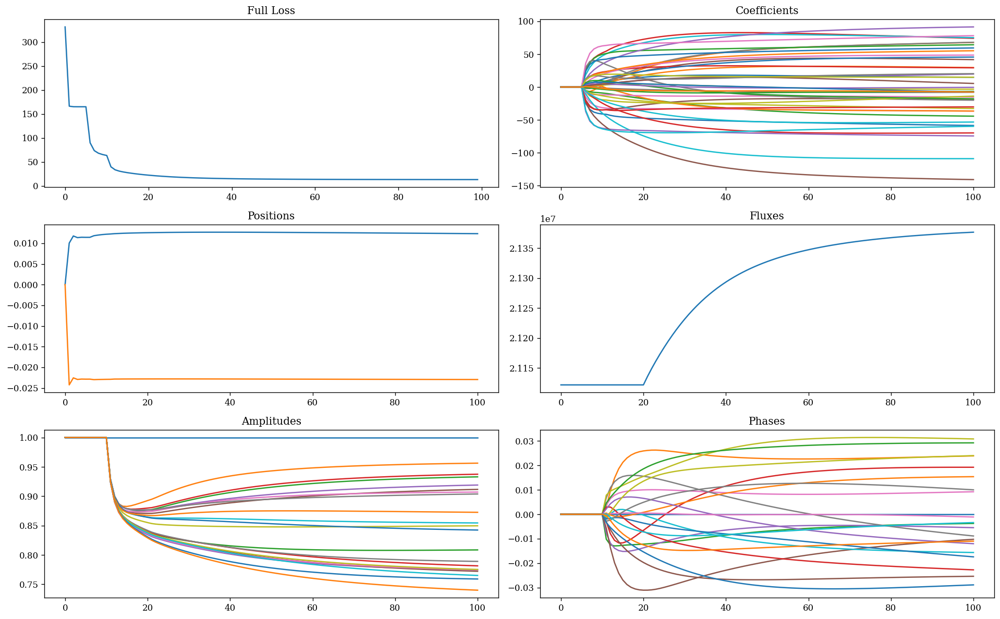

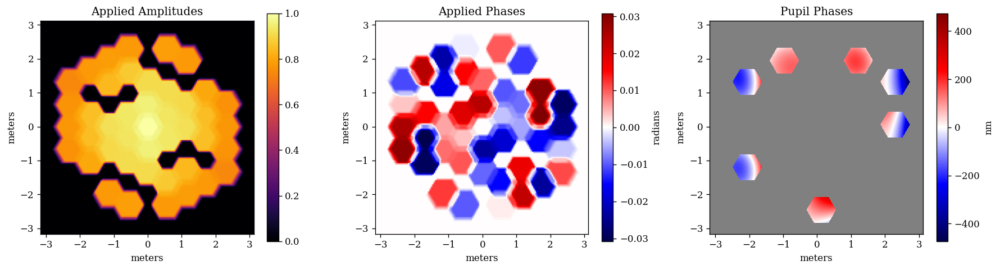

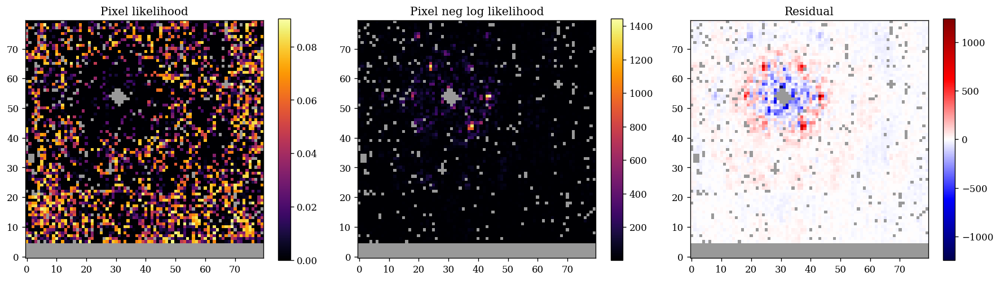

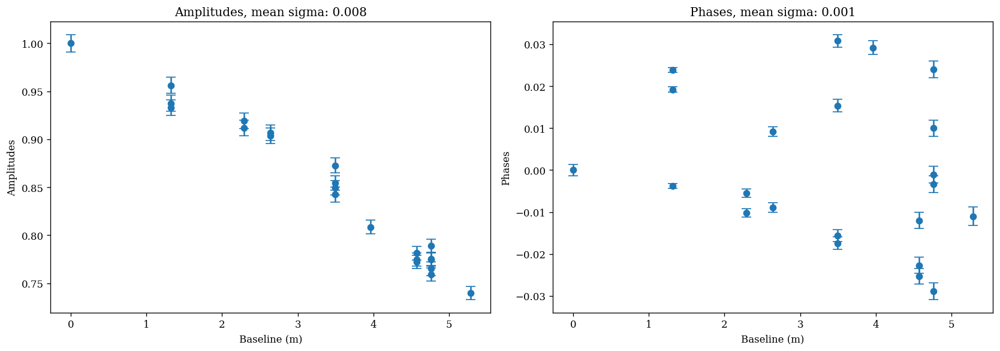

Plotting: AB-DOR_F480M_012_05


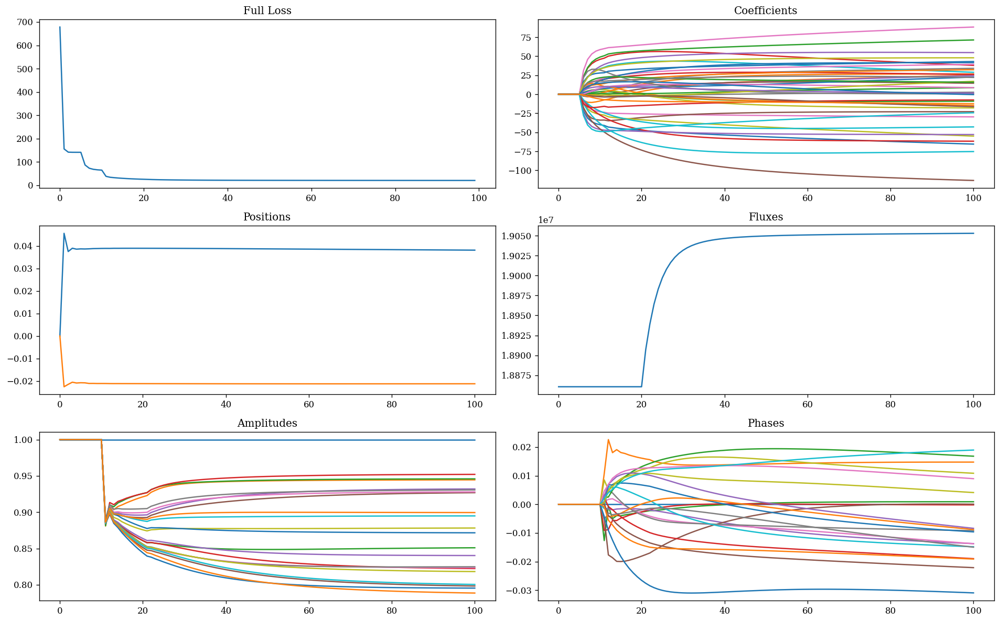

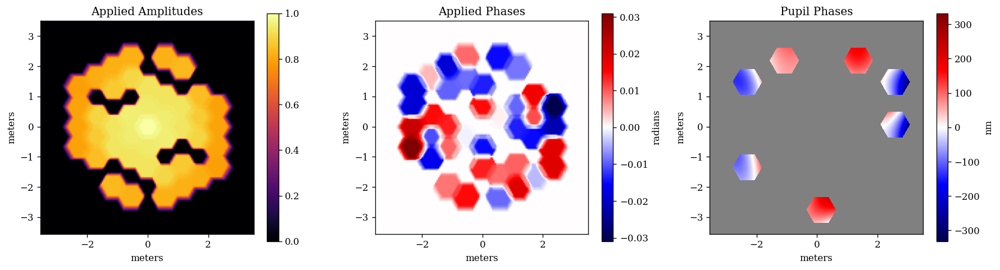

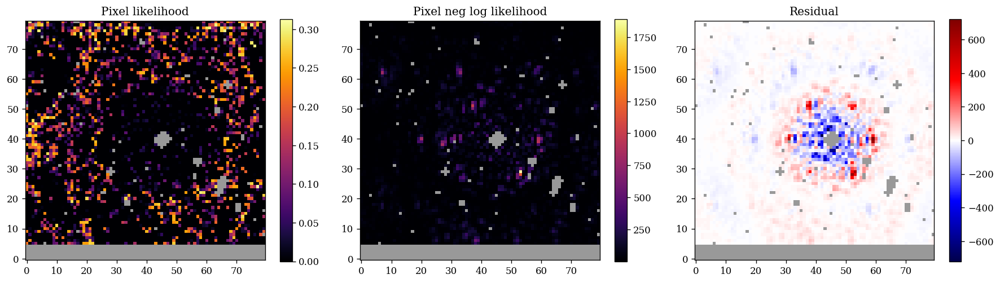

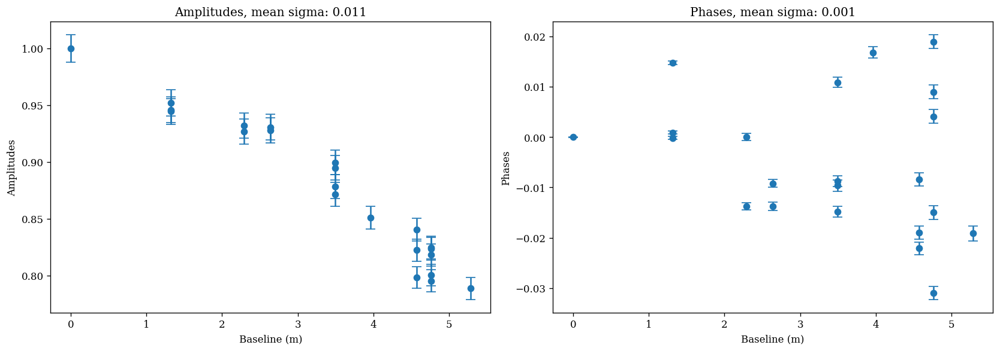

Plotting: AB-DOR_F430M_012_03


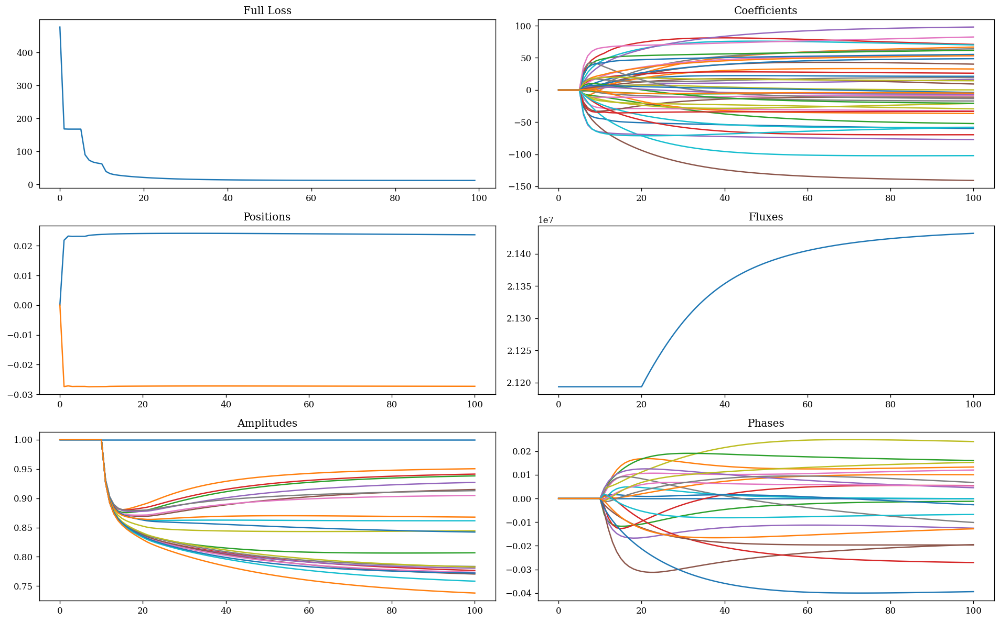

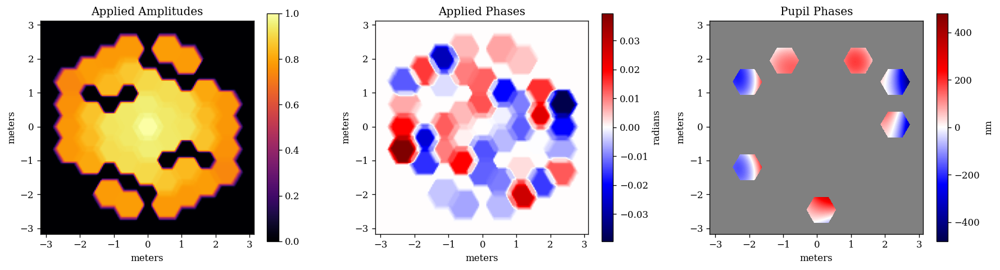

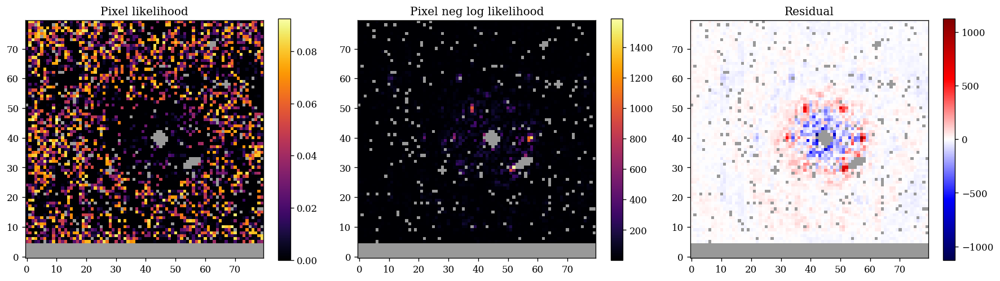

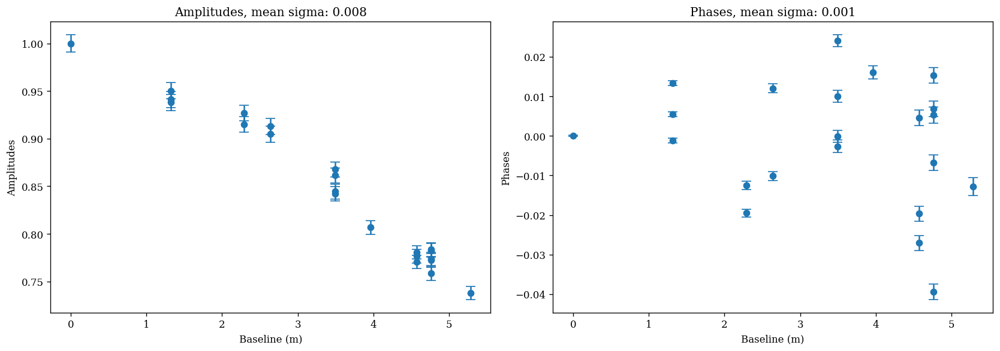

Plotting: AB-DOR_F480M_013_05


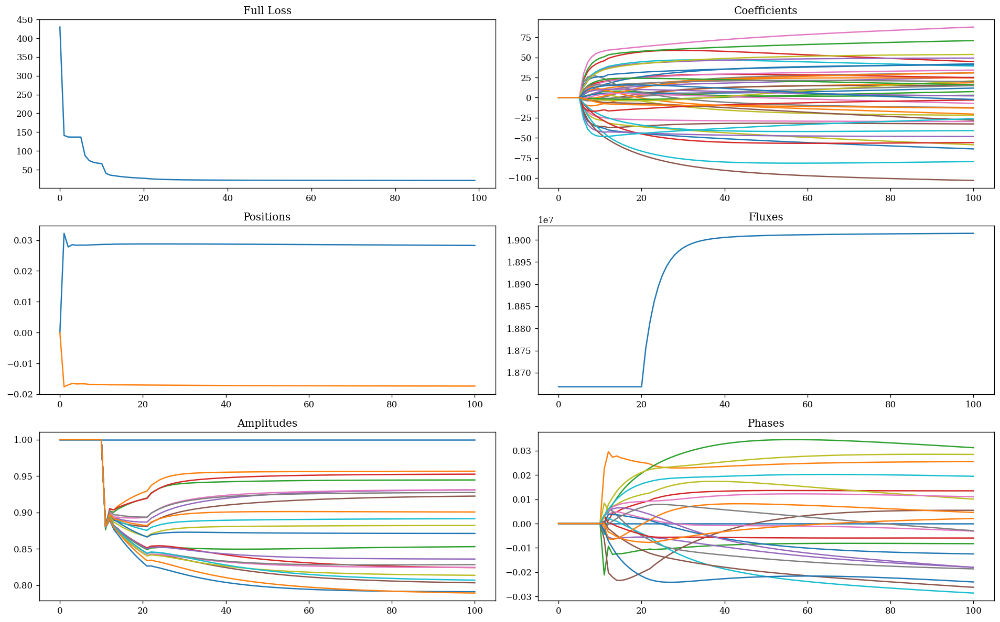

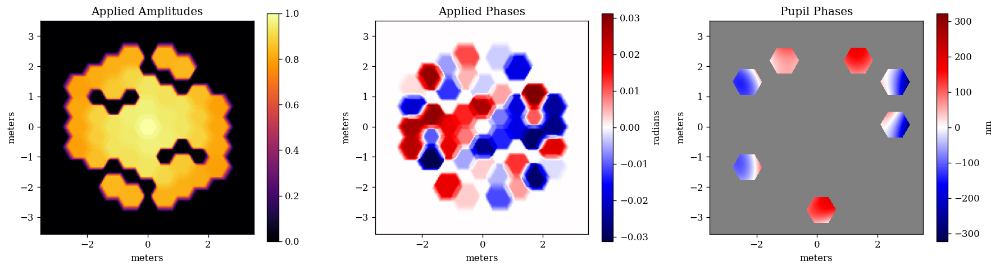

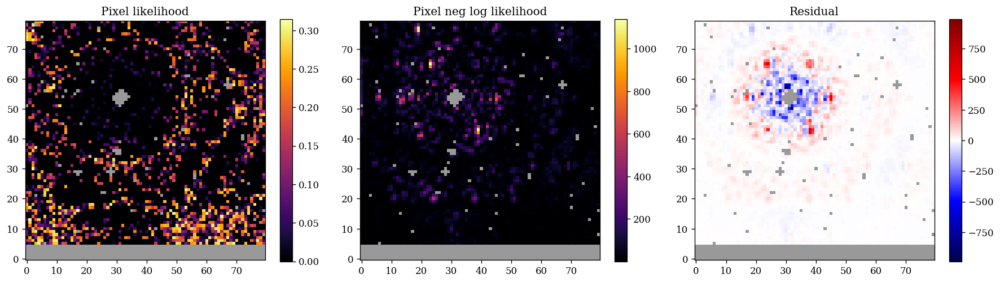

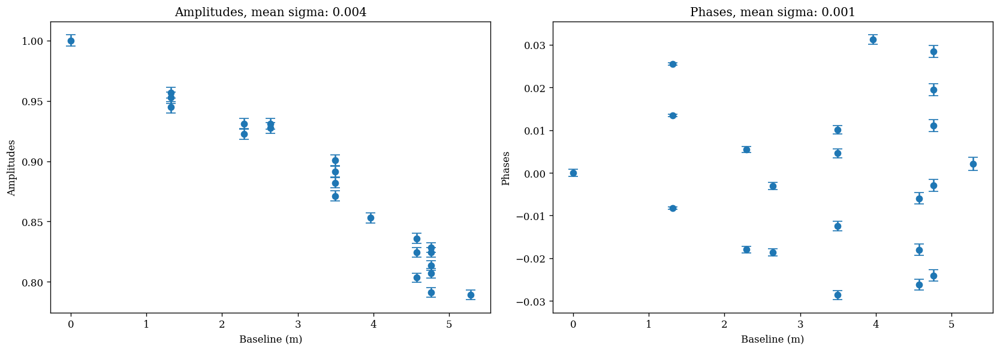

Plotting: AB-DOR_F380M_013_04


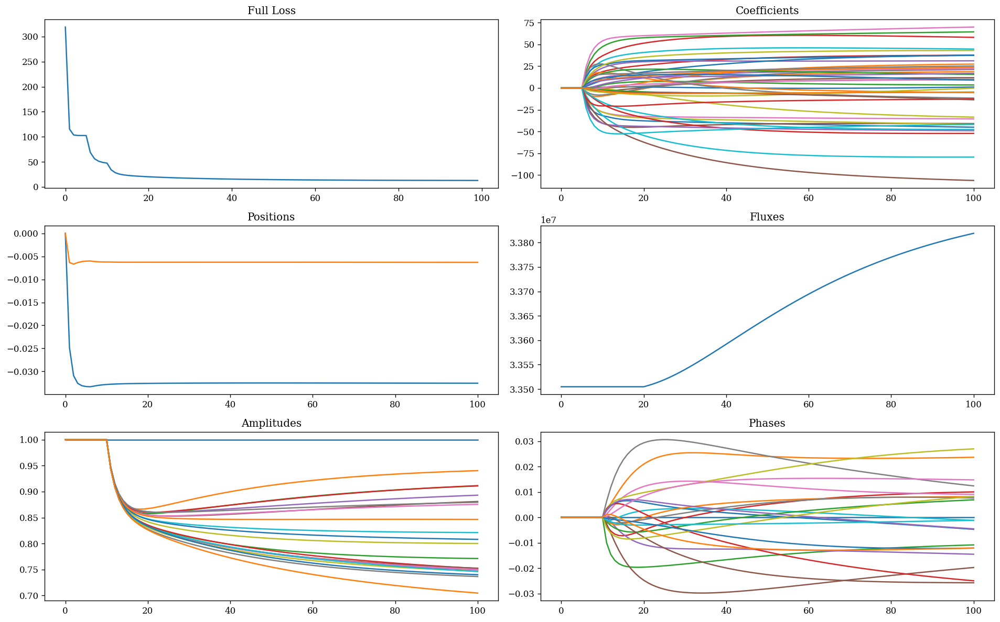

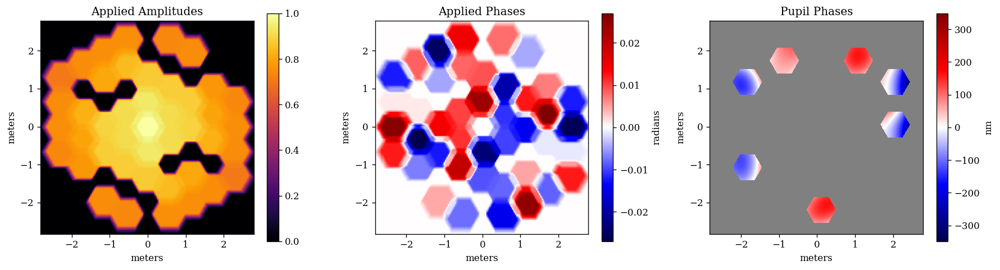

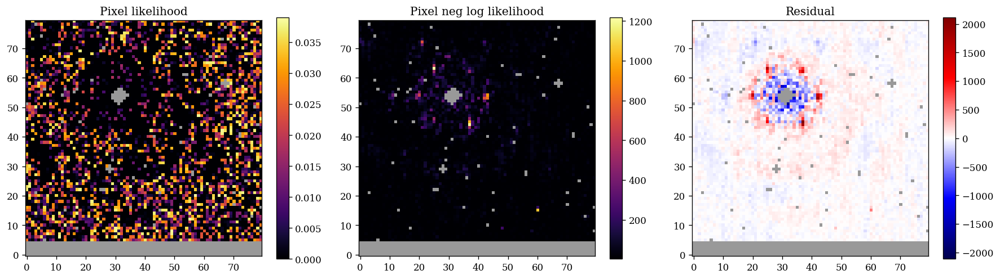

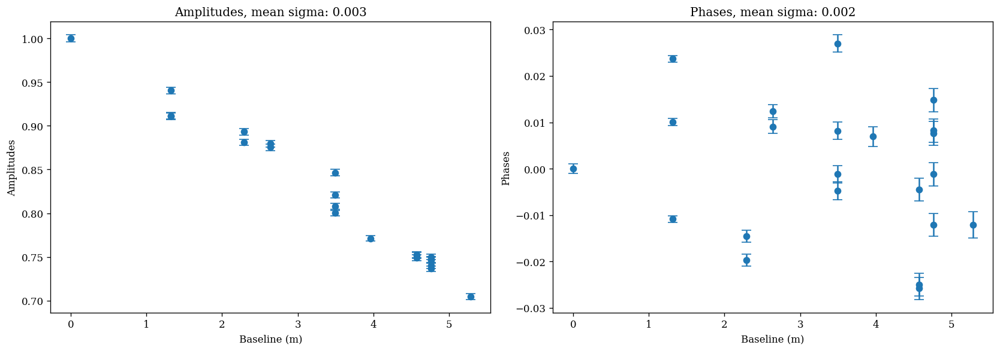

Plotting: AB-DOR_F480M_012_02


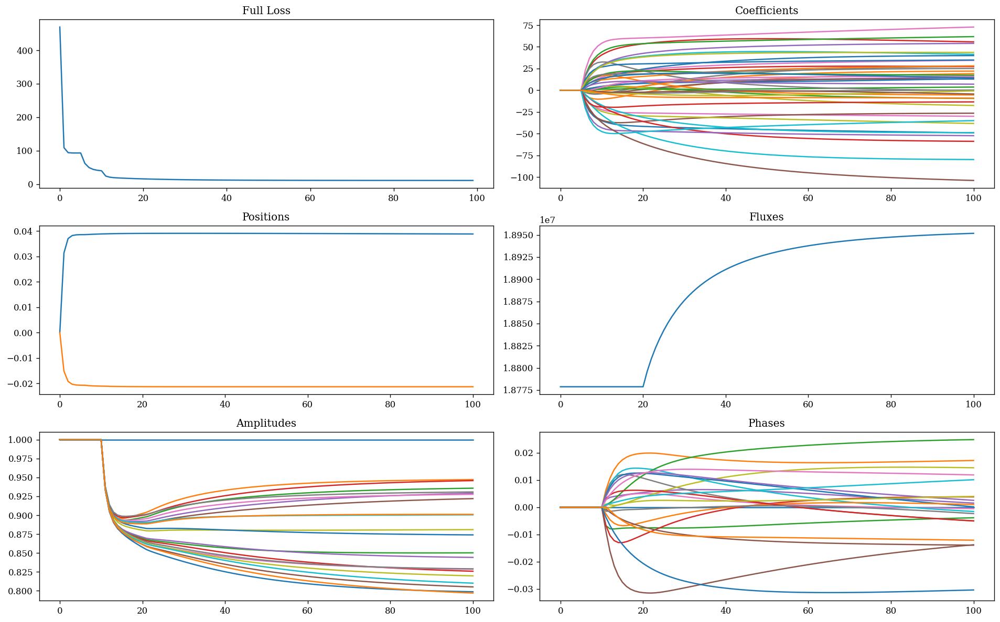

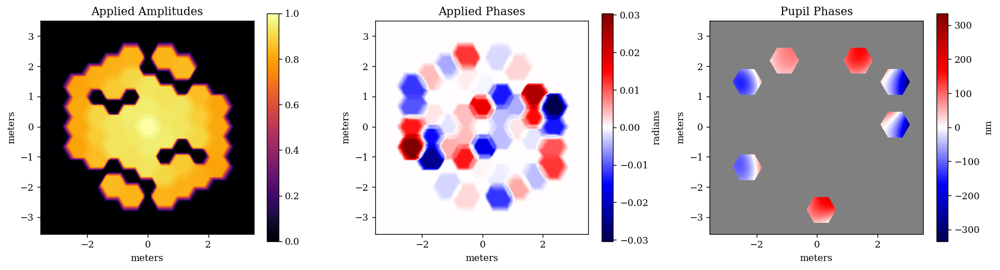

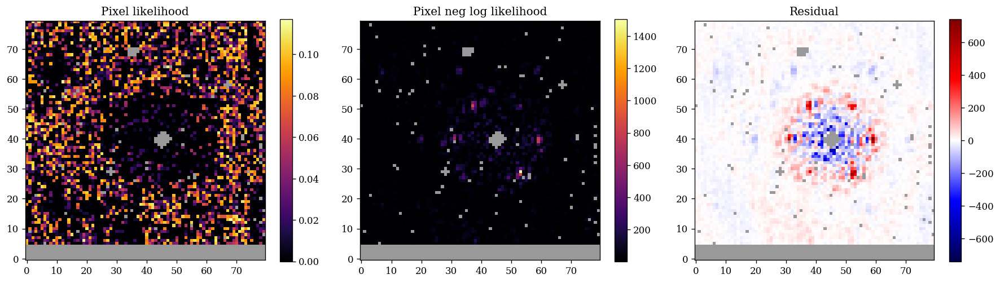

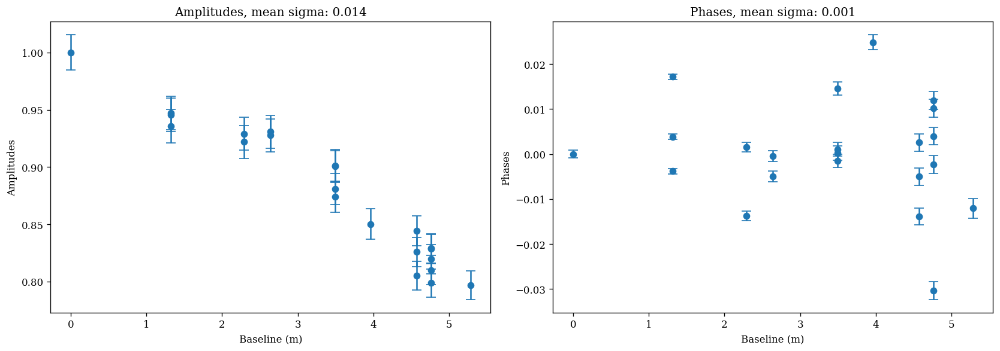

Plotting: AB-DOR_F380M_012_04


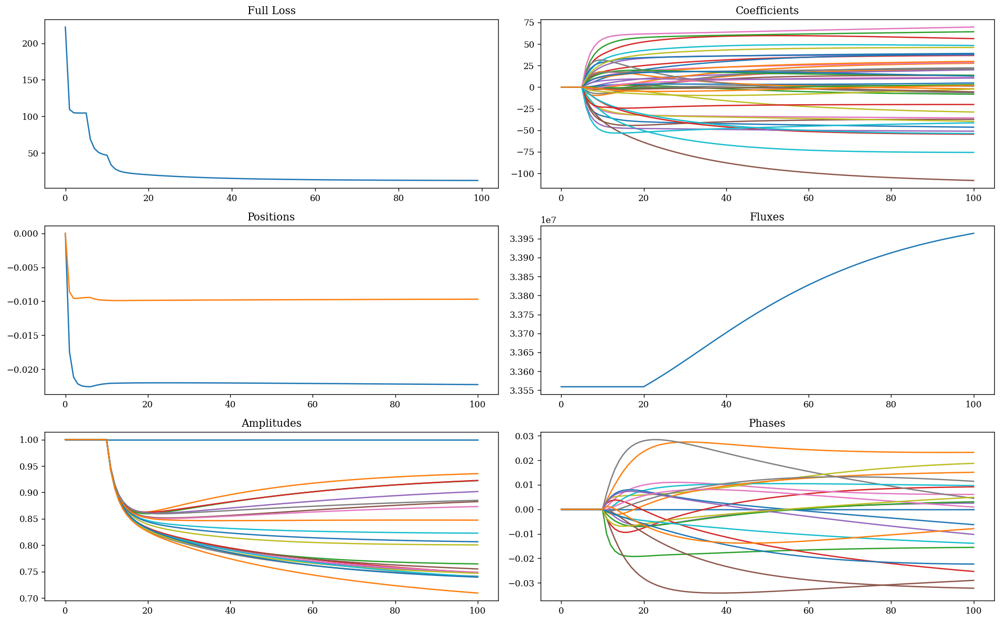

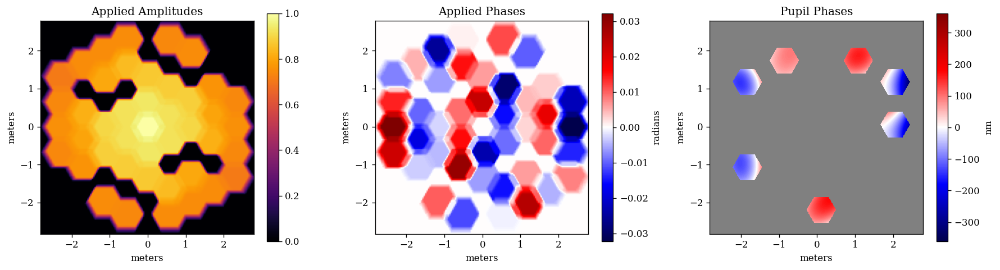

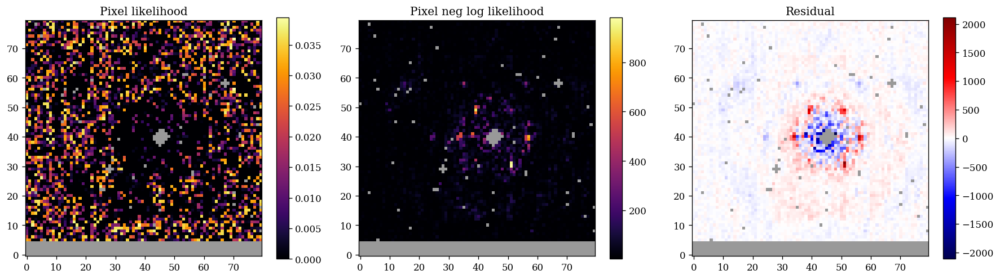

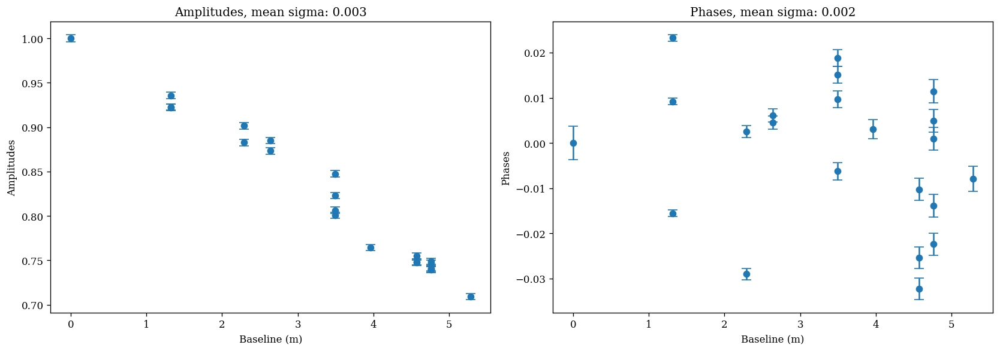

Plotting: AB-DOR_F480M_013_02


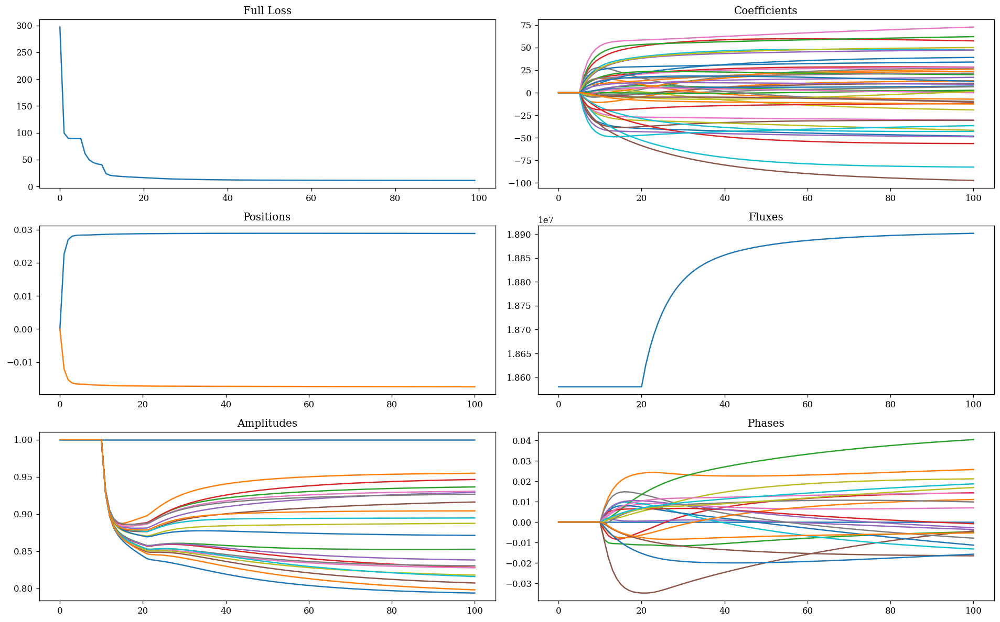

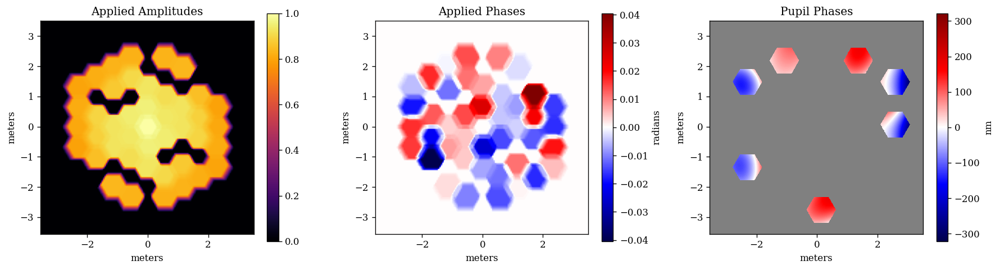

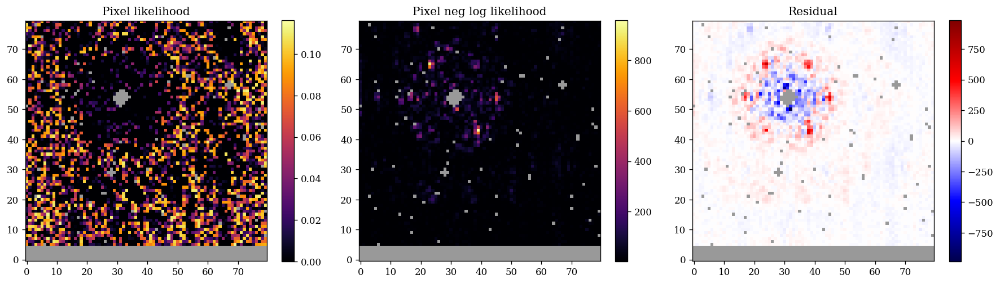

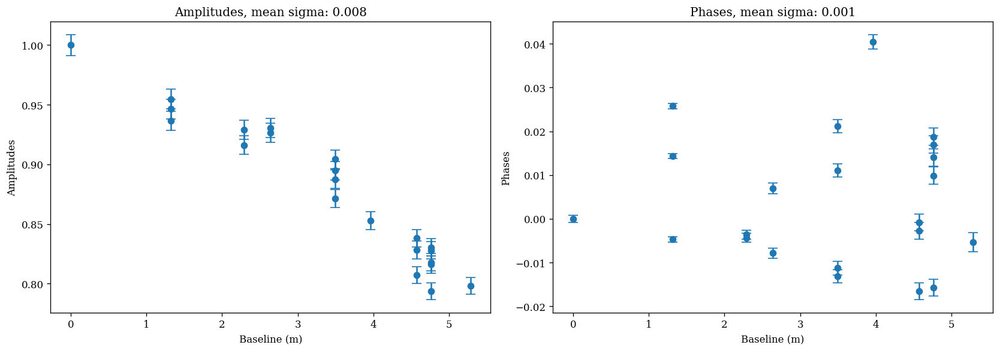

Plotting: HD-37093_F430M_016_03


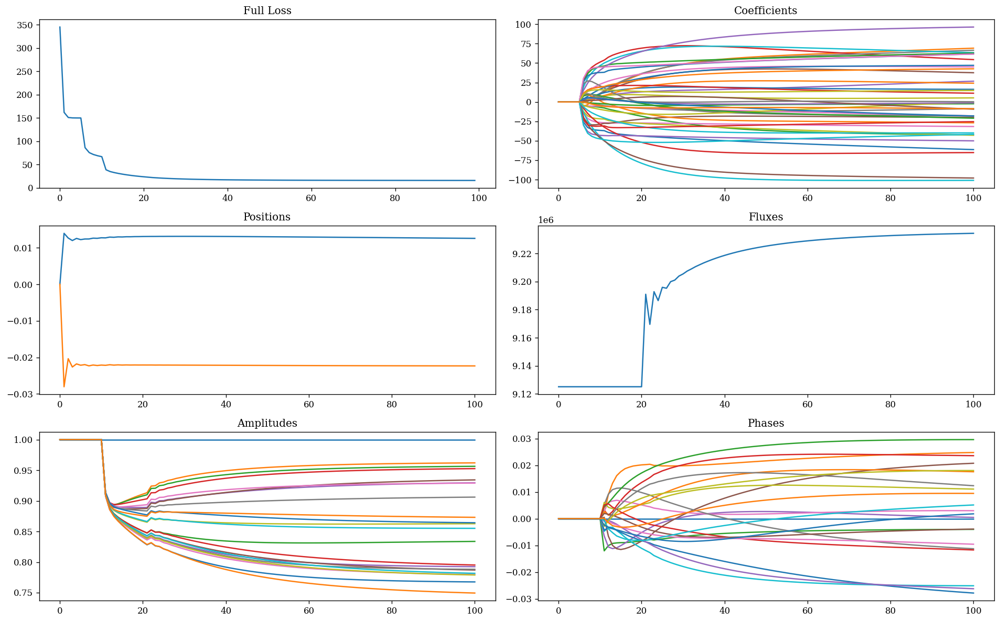

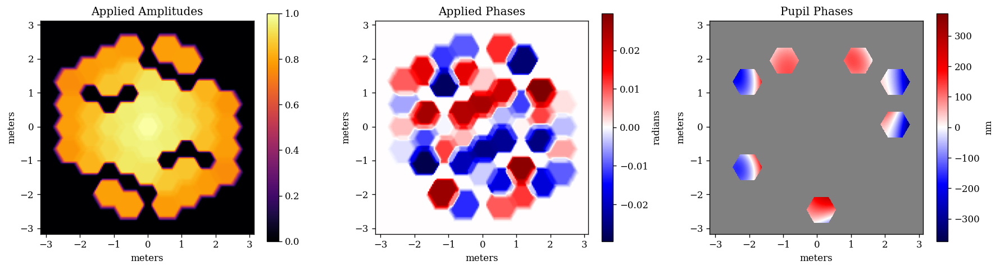

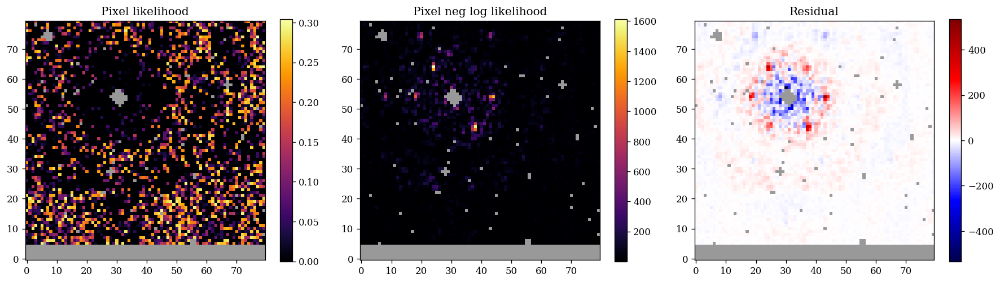

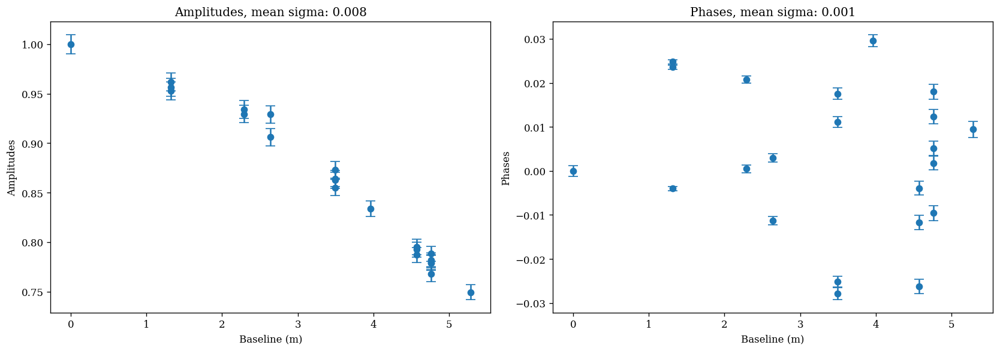

Plotting: HD-37093_F480M_015_02


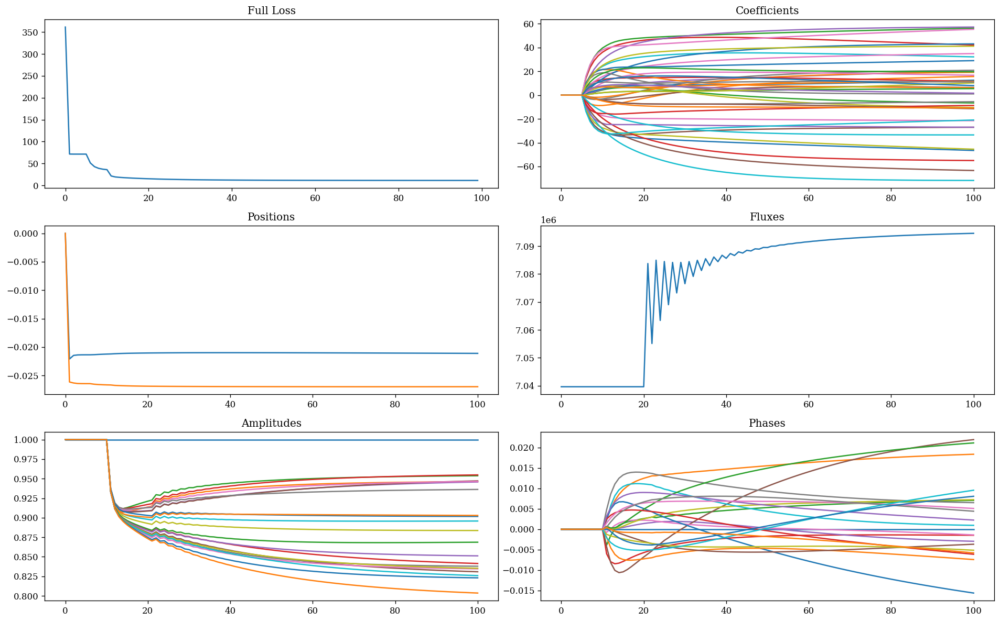

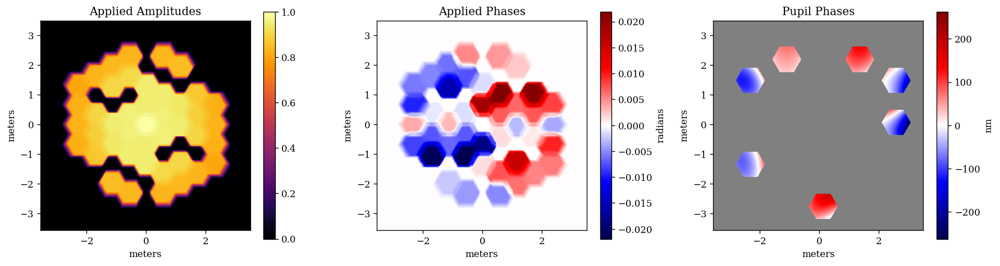

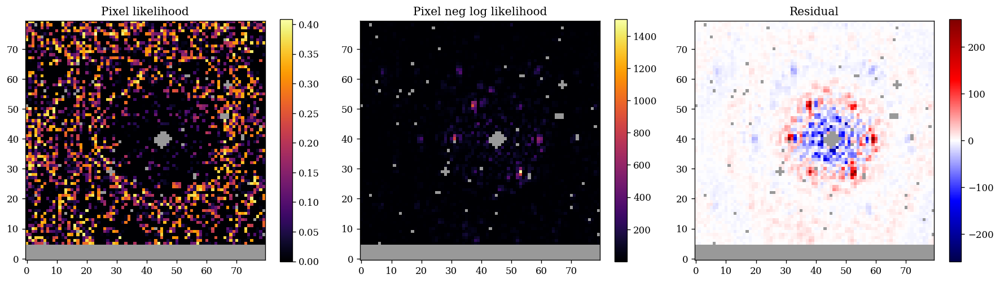

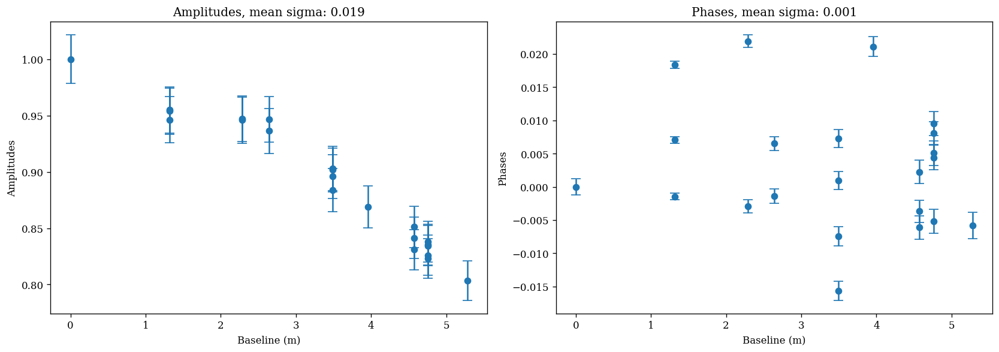

Plotting: HD-37093_F380M_015_04


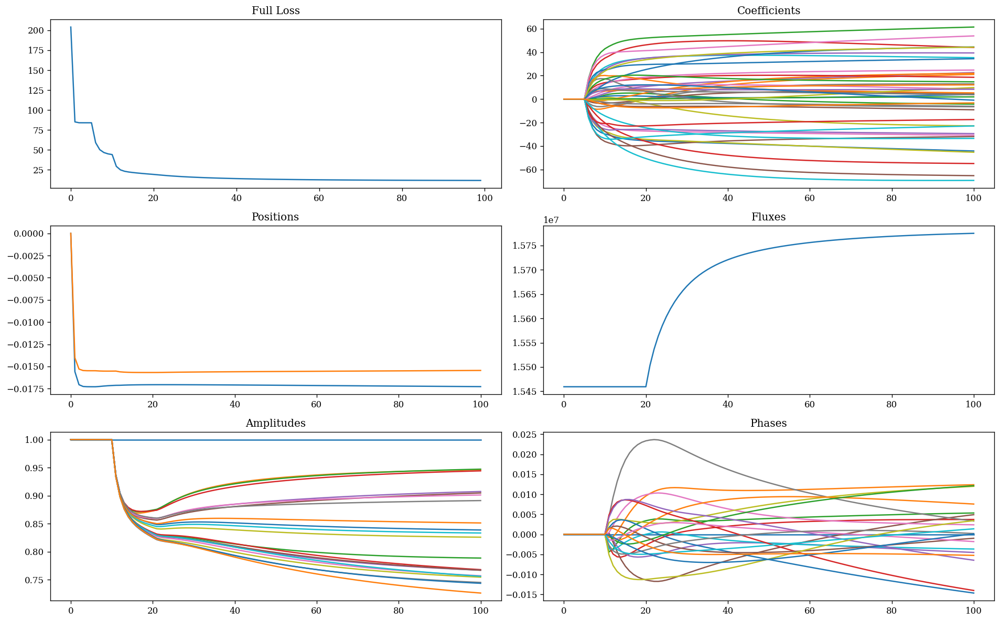

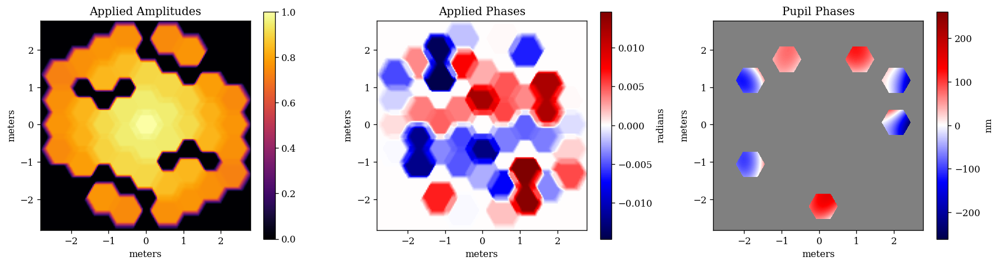

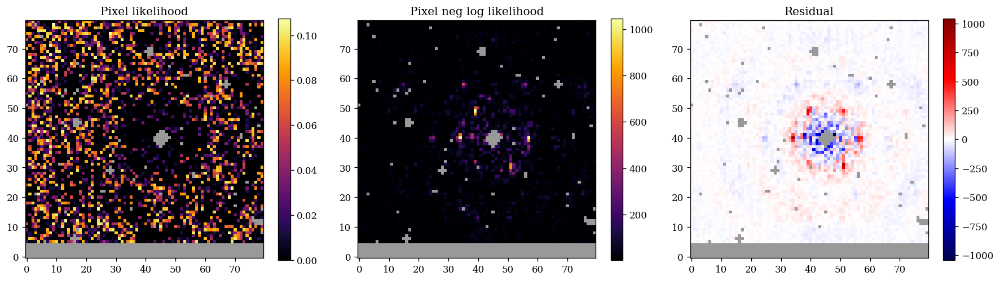

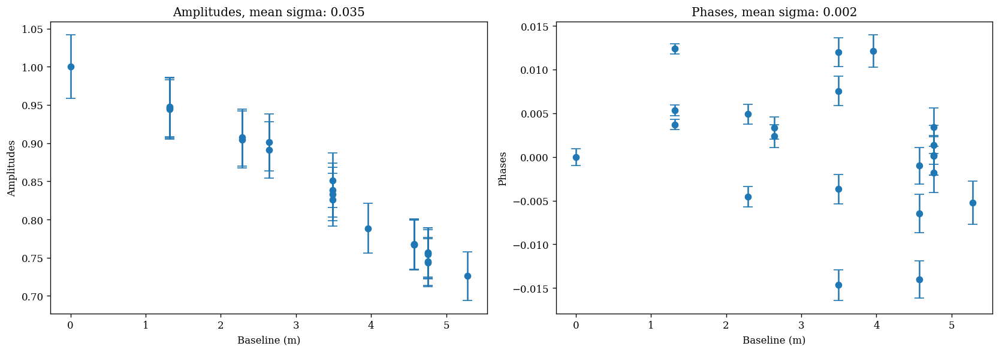

Plotting: HD-37093_F380M_016_04


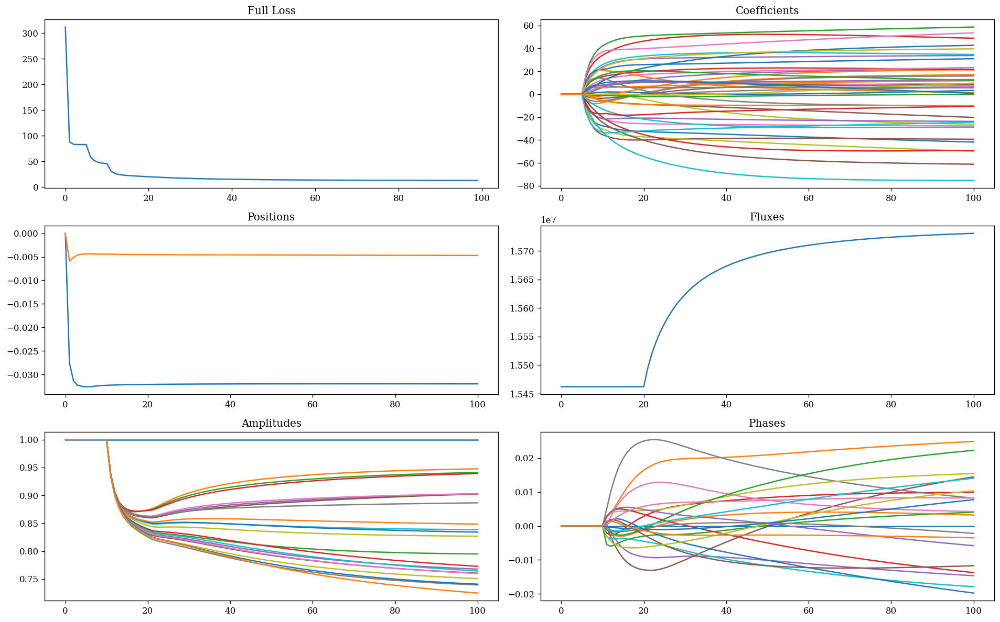

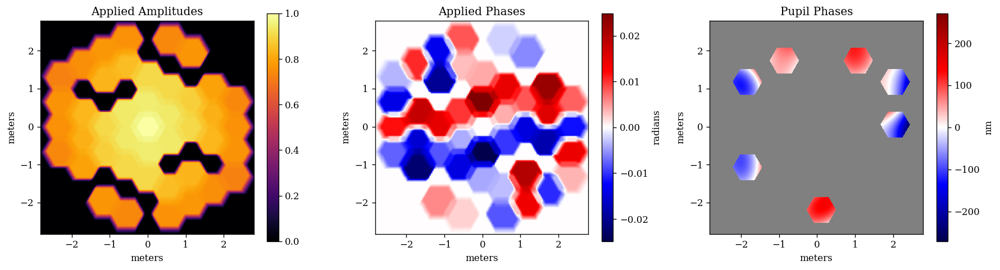

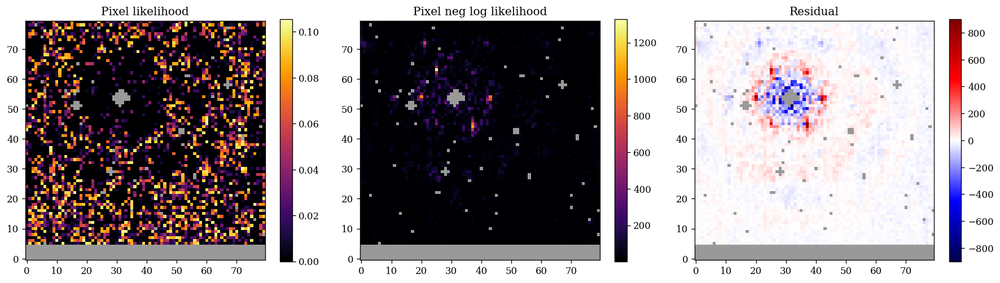

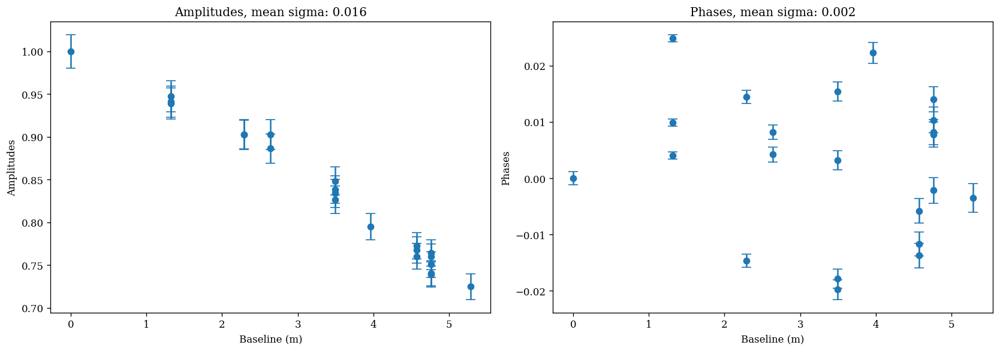

Plotting: HD-37093_F480M_016_02


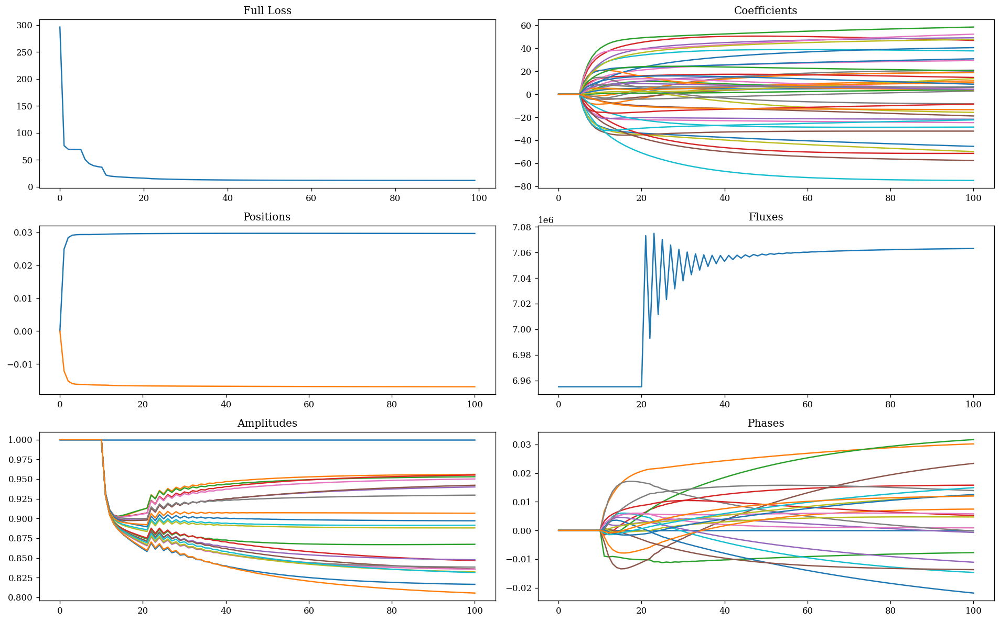

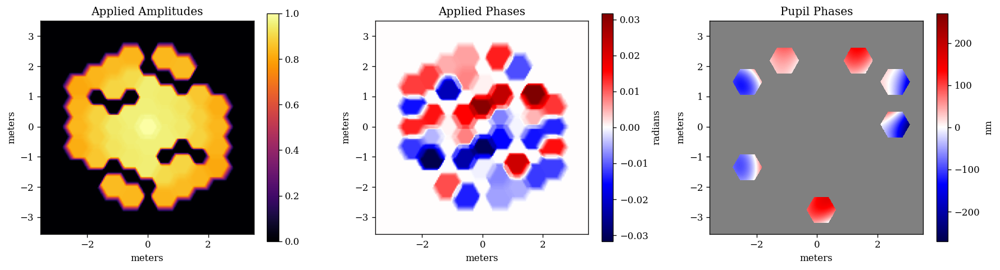

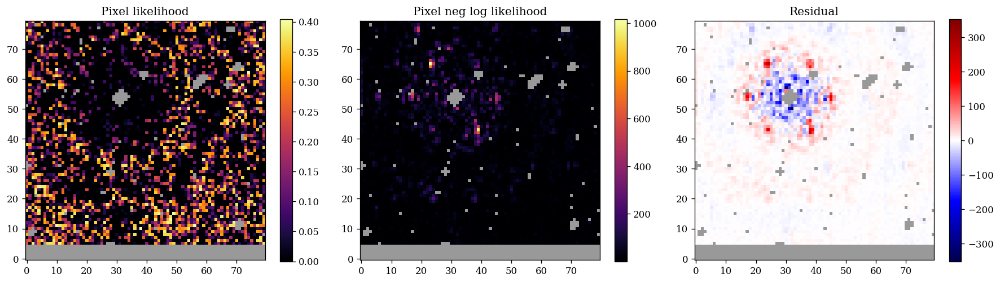

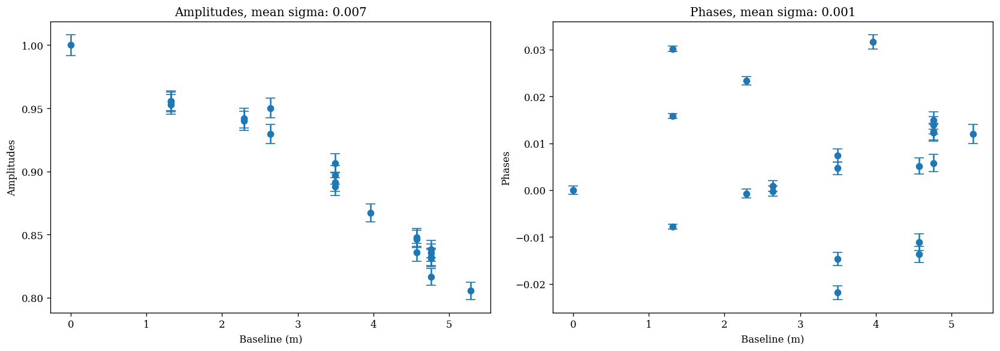

Plotting: HD-37093_F430M_015_03


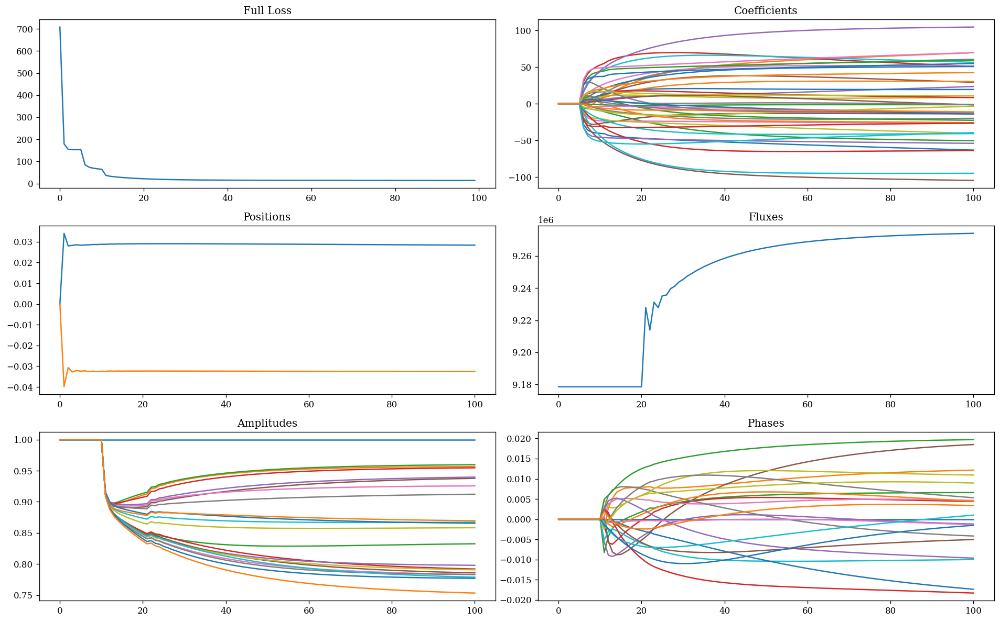

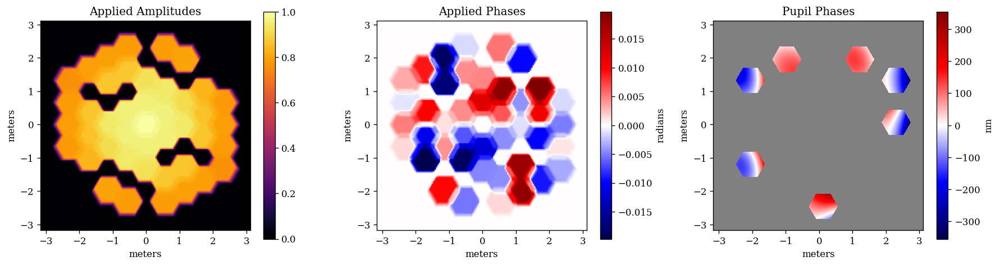

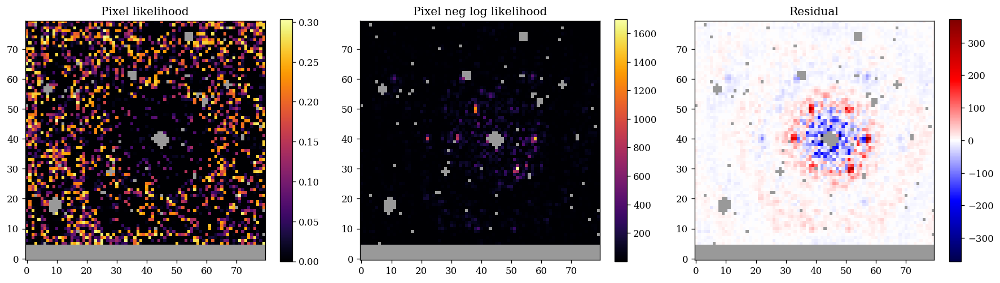

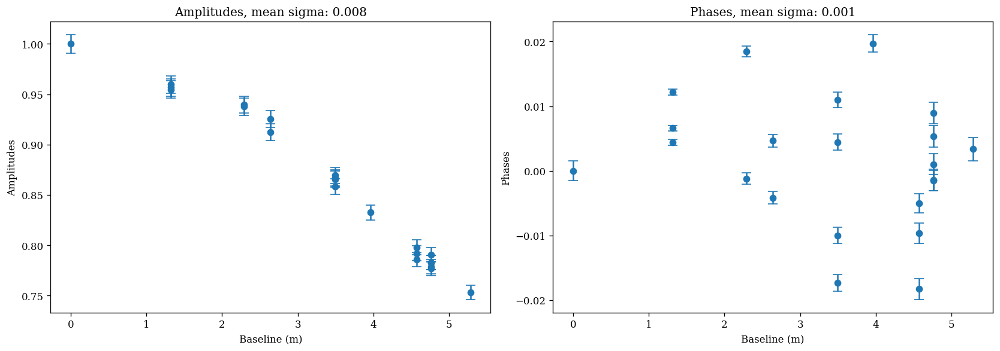

Plotting: HD-36805_F430M_019_03


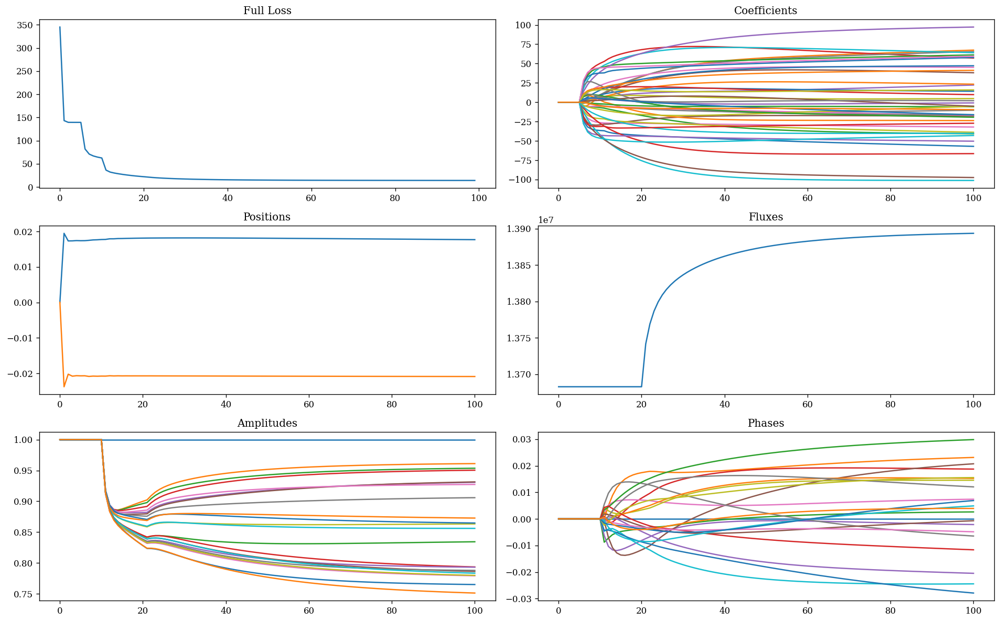

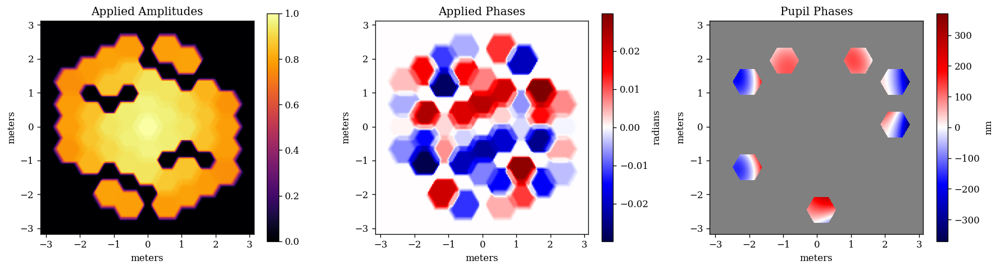

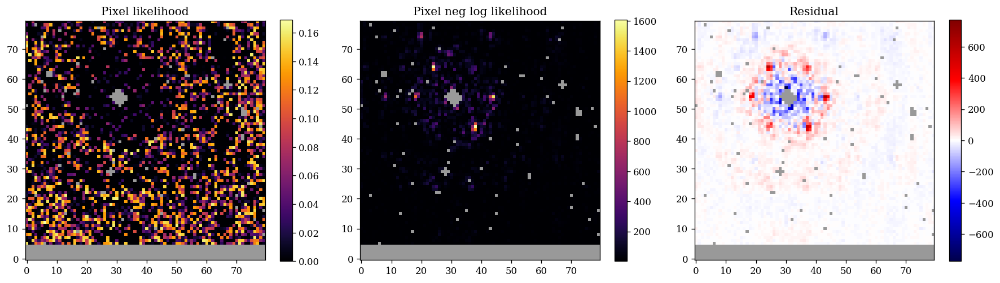

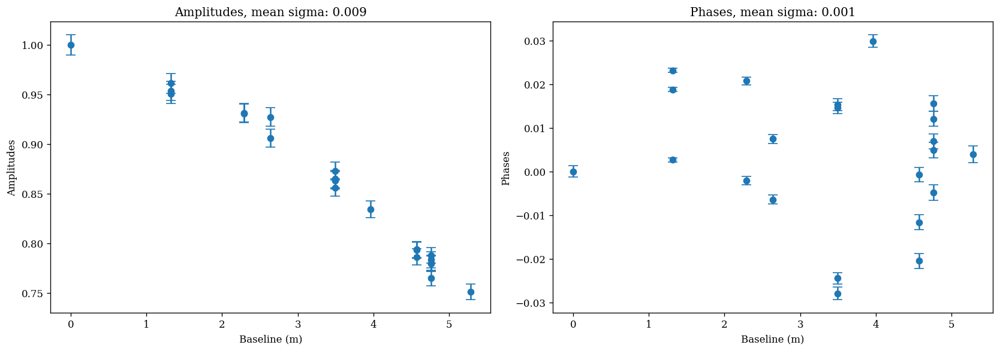

Plotting: HD-36805_F430M_018_03


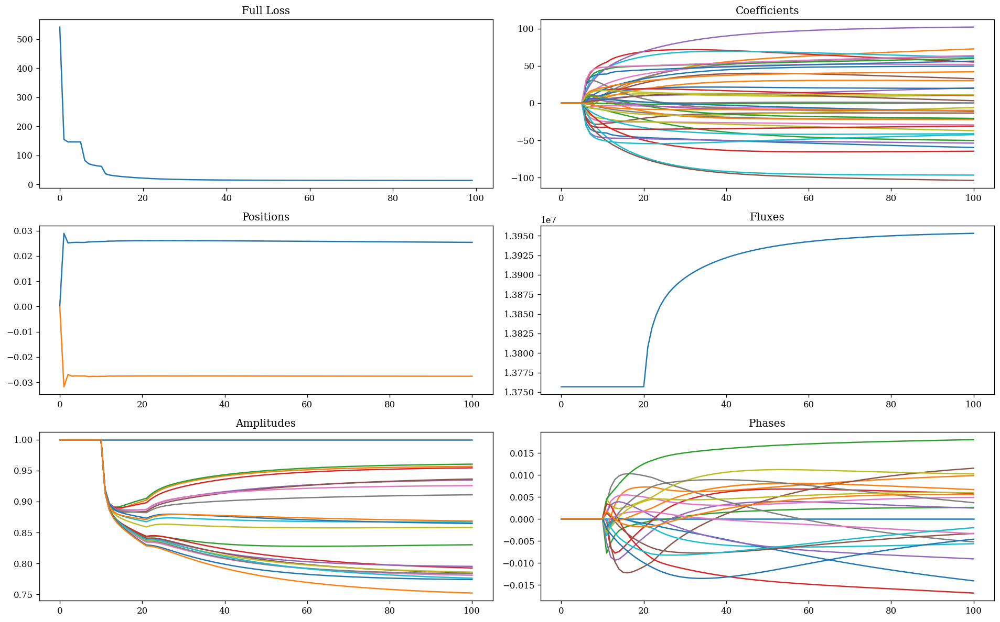

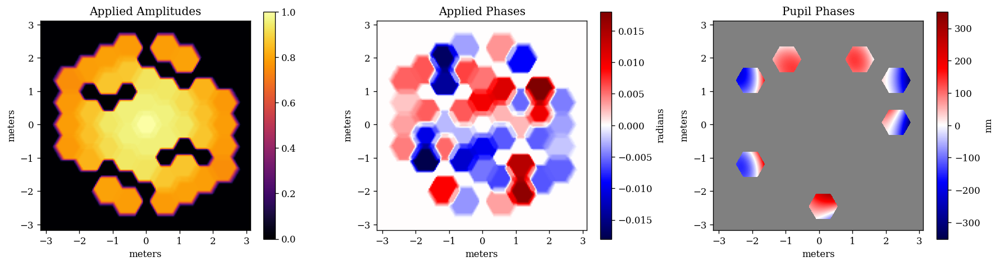

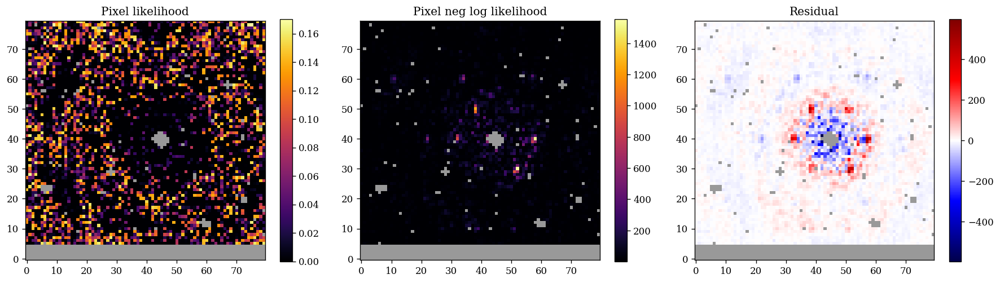

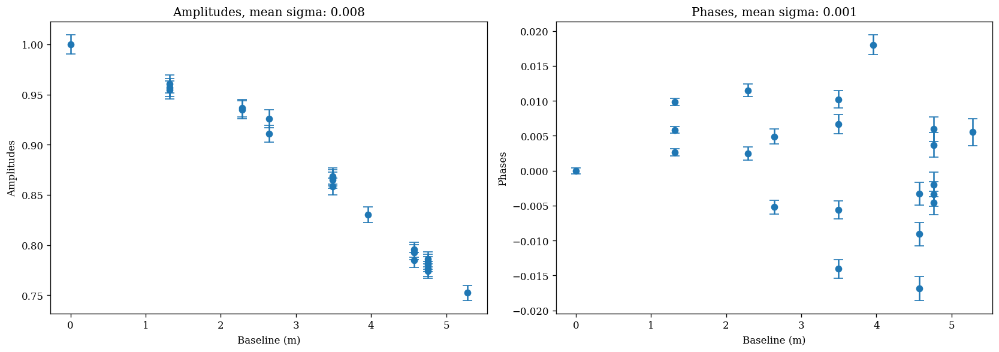

Plotting: HD-36805_F480M_018_02


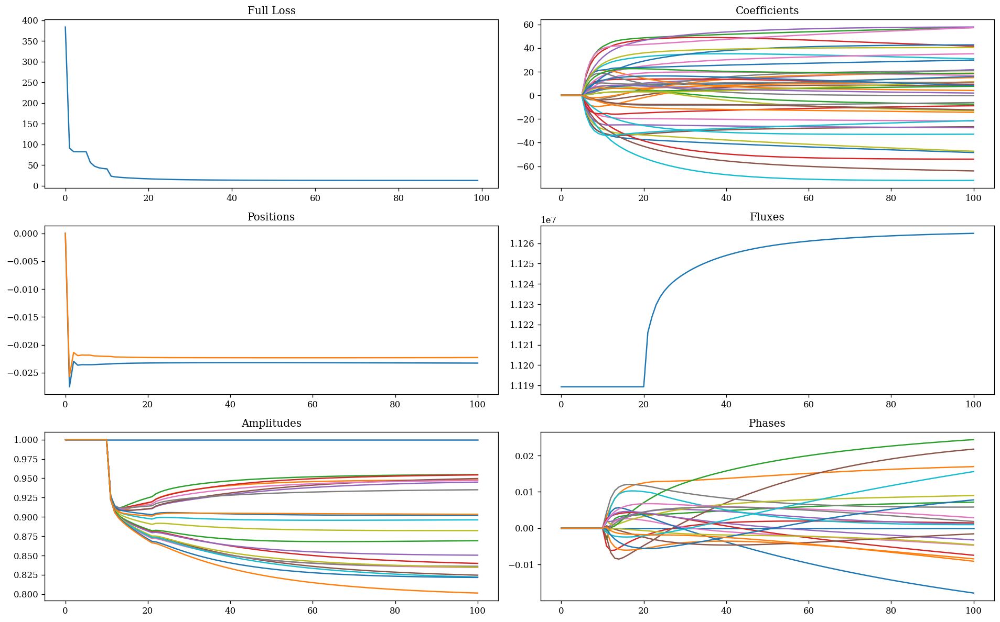

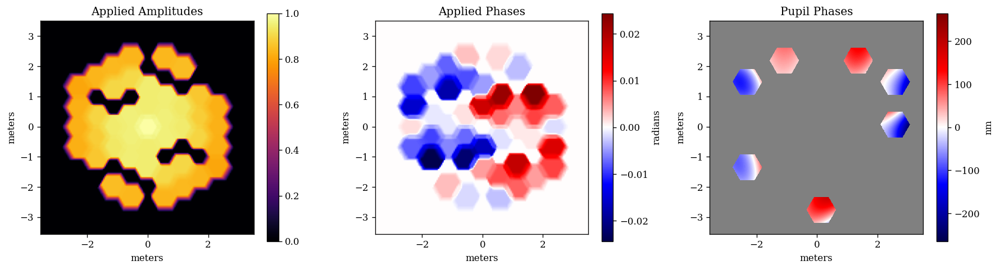

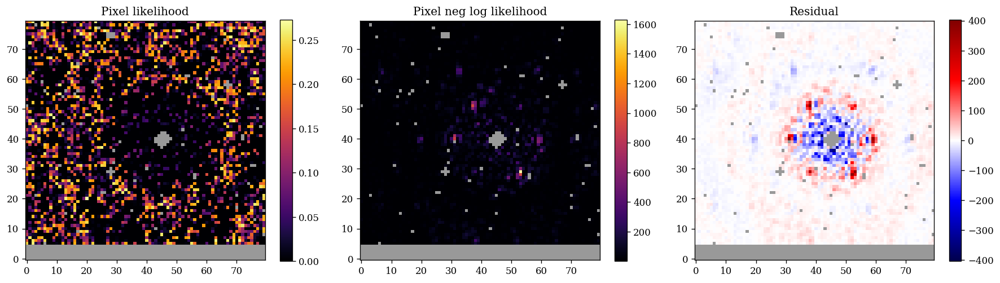

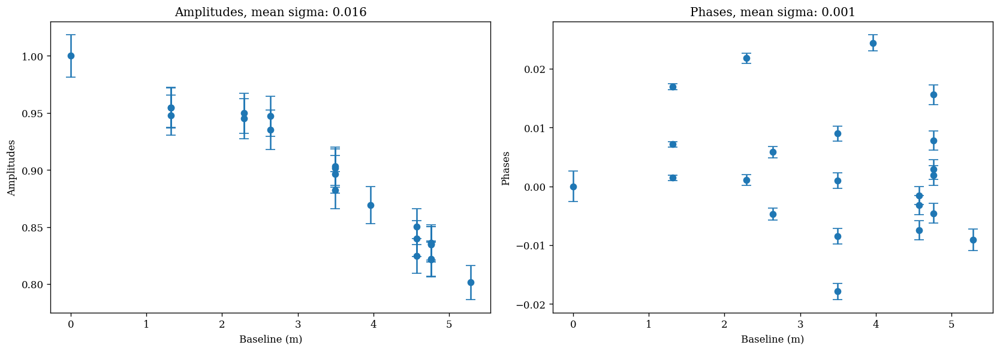

Plotting: HD-36805_F380M_019_04


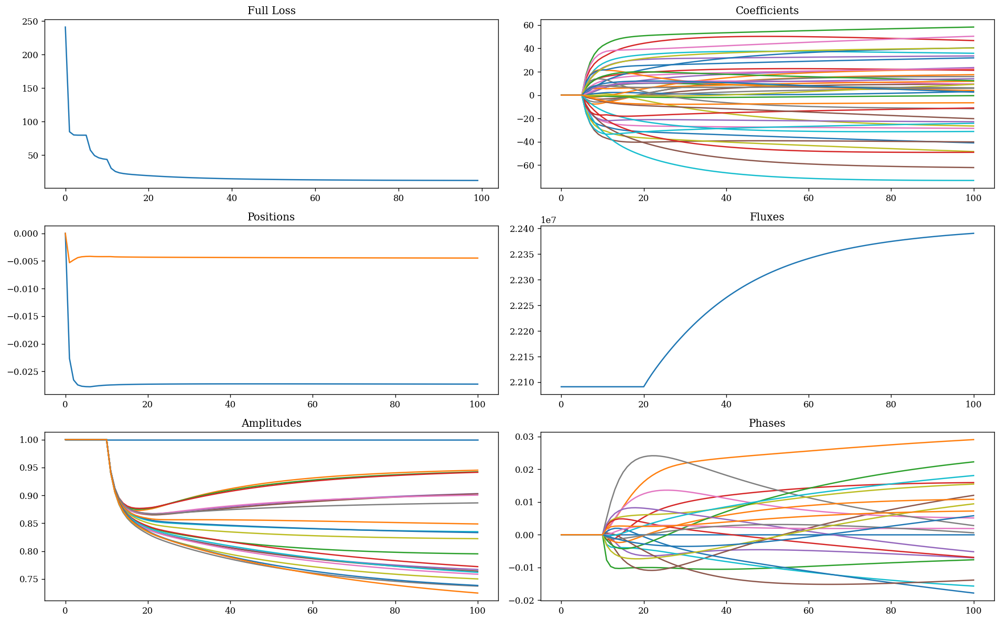

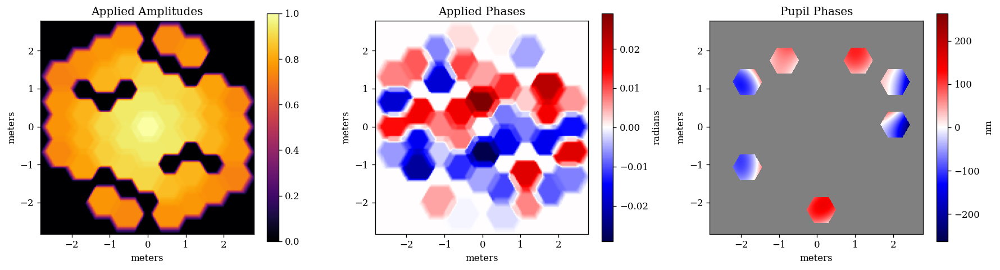

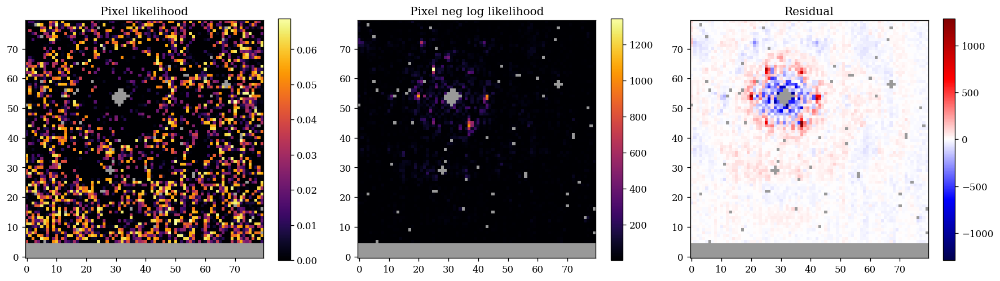

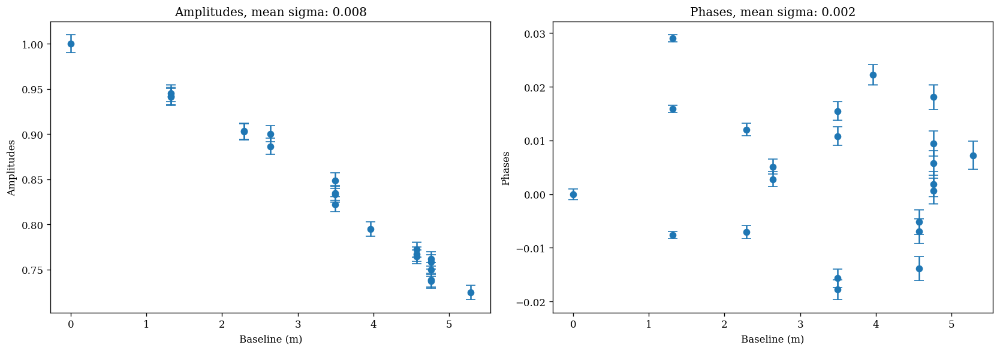

Plotting: HD-36805_F480M_019_02


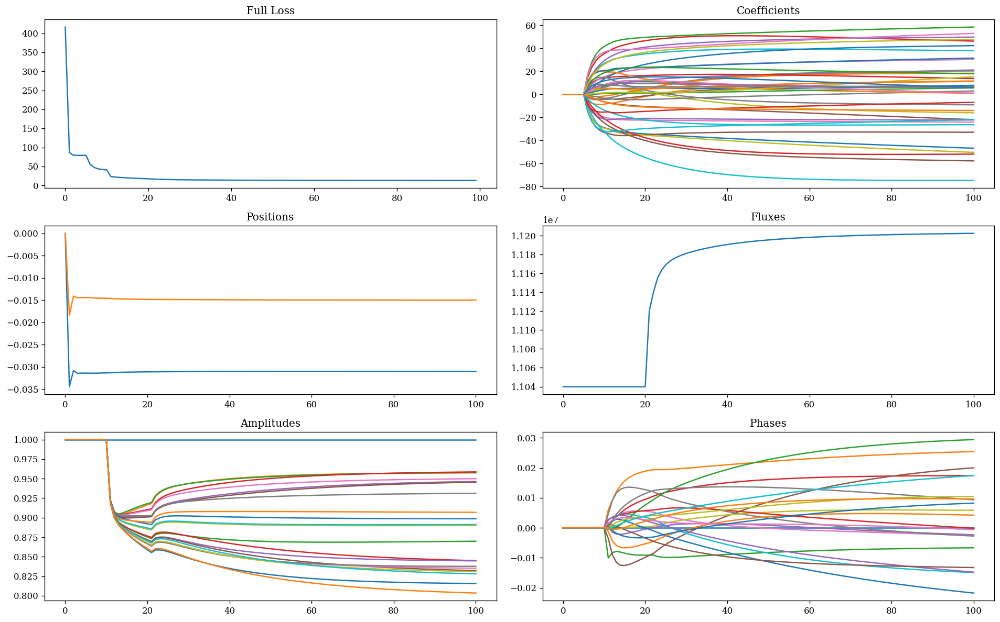

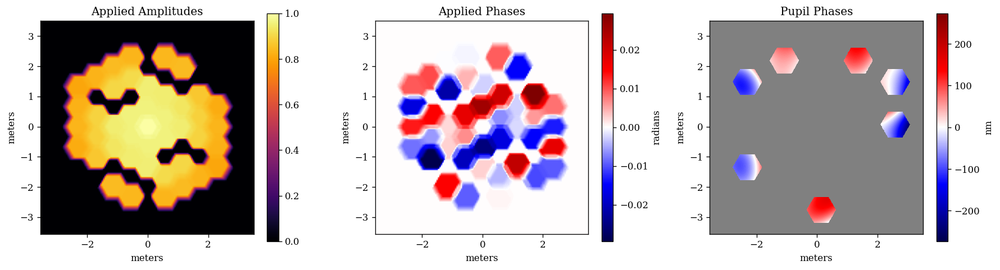

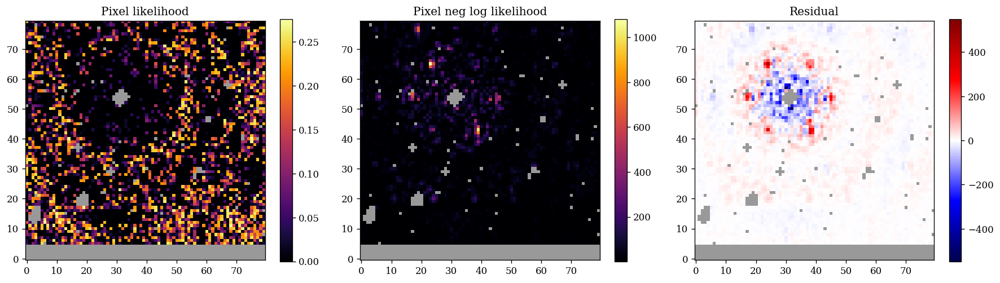

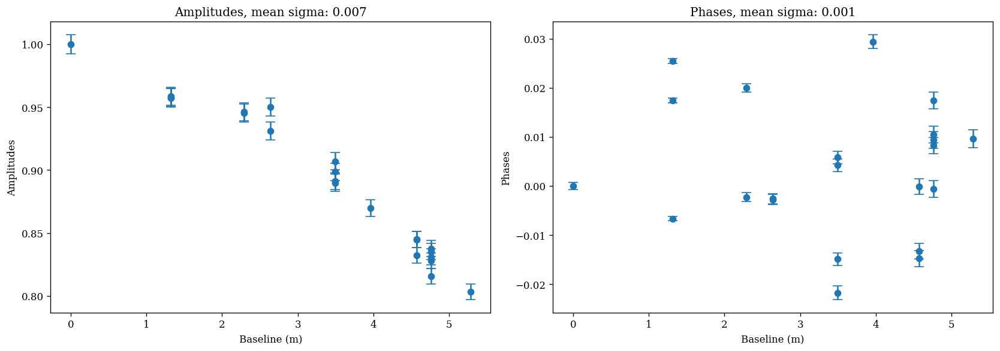

Plotting: HD-36805_F380M_018_04


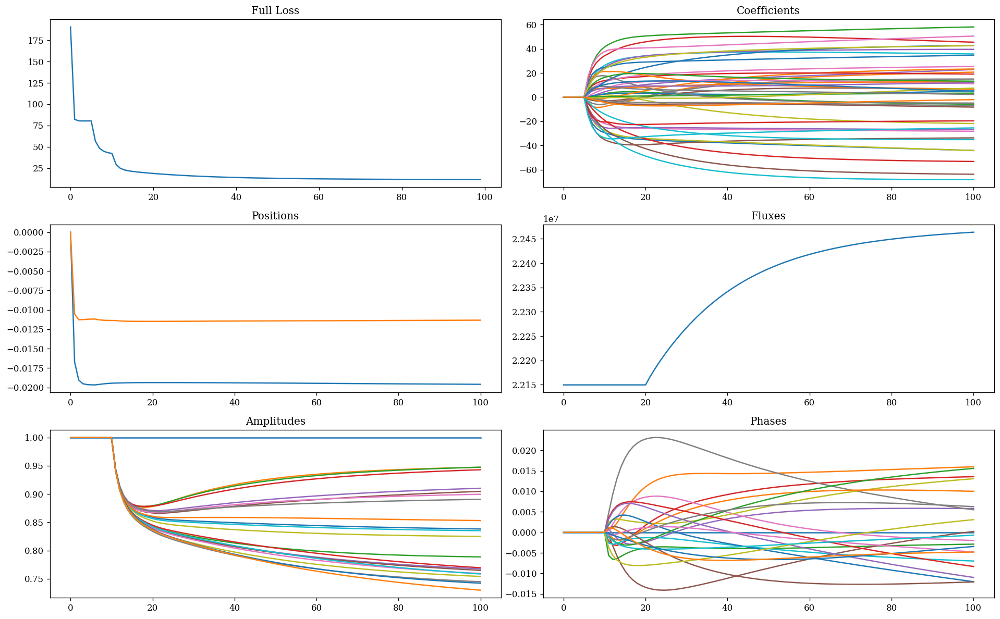

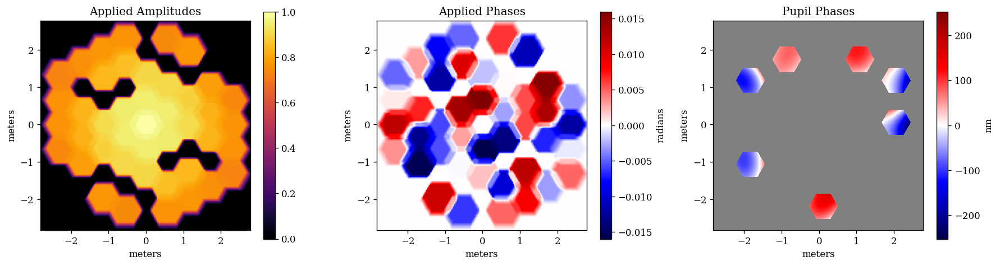

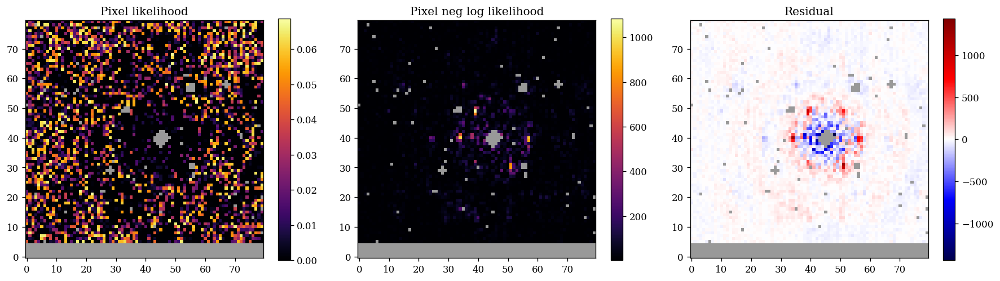

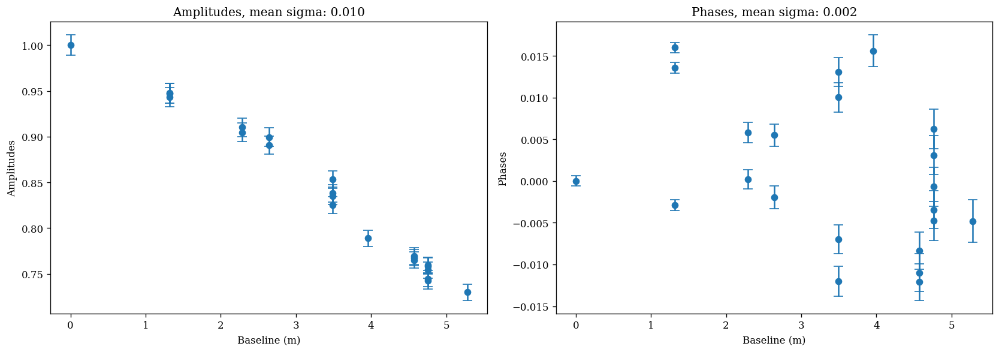

In [8]:
for file in files:
    head = file[0].header
    name = f"{head["TARGPROP"]}_{head["FILTER"]}_{head["OBSERVTN"]}_{head["ACT_ID"]}"
    print(f"Plotting: {name}")

    losses = 1e-4 * np.load(f"files/losses/{name}.npy")
    model = deserialise(f"files/models/{name}.zdx")
    params_out = deserialise(f"files/params/{name}.zdx")
    fim = np.load(f"files/fims/{name}.npy")


    plt.figure(figsize=(16, 10))
    plt.subplot(3, 2, 1)
    plt.title("Full Loss")
    plt.plot(losses)

    coeffs = np.array(params_out["coefficients"])
    plt.subplot(3, 2, 2)
    plt.title(f"Coefficients")
    plt.plot(coeffs.reshape(len(coeffs), -1))

    positions = np.array(params_out["position"])
    plt.subplot(3, 2, 3)
    plt.title("Positions")
    plt.plot(positions - positions[0])

    plt.subplot(3, 2, 4)
    plt.title("Fluxes")
    plt.plot(params_out["flux"])

    plt.subplot(3, 2, 5)
    plt.title("Amplitudes")
    plt.plot(params_out["amplitudes"])

    plt.subplot(3, 2, 6)
    plt.title("Phases")
    plt.plot(params_out["phases"])

    plt.tight_layout()
    plt.show()

    show_splodges(model, s=75, pupil_phases=True)
    show_likelihoods(model, file, n_mask=3, order=2, k=0.4)

    holes = mask_definitions.jwst_g7s6c()[1]
    plot_vis(holes, model, fim)